<a href="https://colab.research.google.com/github/BRIAN12682/Automation-Projects/blob/main/NLEGRADCAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [41]:
import tensorflow as tf### models
import numpy as np### math computations
import matplotlib.pyplot as plt### plotting bar chart
import sklearn### machine learning library
import cv2## image processing
from sklearn.metrics import confusion_matrix, roc_curve### metrics
import seaborn as sns### visualizations
import datetime
import pathlib
import io
import os
import time
import random
from google.colab import files
from PIL import Image
import albumentations as A
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import matplotlib.cm as cm
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import (GlobalAveragePooling2D, Activation, MaxPooling2D, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, Embedding, Permute,
                                     Dropout, RandomFlip, RandomRotation, LayerNormalization, MultiHeadAttention,
                                     RandomContrast, Rescaling, Resizing, Reshape)
from tensorflow.keras.losses import BinaryCrossentropy,CategoricalCrossentropy, SparseCategoricalCrossentropy
from tensorflow.keras.metrics import Accuracy,TopKCategoricalAccuracy, CategoricalAccuracy, SparseCategoricalAccuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (Callback, CSVLogger, EarlyStopping, LearningRateScheduler,
                                        ModelCheckpoint, ReduceLROnPlateau)
from tensorflow.keras.regularizers  import L2, L1
from tensorflow.train import BytesList, FloatList, Int64List
from tensorflow.train import Example, Features, Feature
from google.colab import drive

In [42]:
CONFIGURATION = {
    "BATCH_SIZE": 32,
    "IM_SIZE": 256,
    "LEARNING_RATE": 1e-3,
    "N_EPOCHS": 20,
    "DROPOUT_RATE": 0.0,
    "REGULARIZATION_RATE": 0.0,
    "N_FILTERS": 6,
    "KERNEL_SIZE": 3,
    "N_STRIDES": 1,
    "POOL_SIZE": 2,
    "N_DENSE_1": 1024,
    "N_DENSE_2": 128,
    "NUM_CLASSES": 2,
    "PATCH_SIZE": 16,
    "PROJ_DIM": 768,
    "CLASS_NAMES": ["Positive", "Negative"],
}

In [43]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
import os
import shutil
from sklearn.model_selection import train_test_split


In [8]:
base_dir = '/content/drive/MyDrive/Resized_Annotated_Folder/' # Adjust this path to your dataset location
train_dir = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/'
val_dir = '/content/drive/MyDrive/DATASETS/Annotated_Folder/val/'

# Create directories for train and validation sets
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

for class_name in ['Positive', 'Negative']:
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)


In [ ]:
# Helper function to split data
def split_data(SOURCE, TRAINING, VALIDATION, SPLIT_SIZE):
    all_files = os.listdir(SOURCE)
    files = [f for f in all_files if os.path.isfile(os.path.join(SOURCE, f))]

    train_files, val_files = train_test_split(files, test_size=SPLIT_SIZE, random_state=42)

    for file in train_files:
        shutil.copy(os.path.join(SOURCE, file), os.path.join(TRAINING, file))

    for file in val_files:
        shutil.copy(os.path.join(SOURCE, file), os.path.join(VALIDATION, file))

# Split ratio
split_size = 0.2  # 20% for validation

# Split for class1
split_data(os.path.join(base_dir, 'Positive'),
           os.path.join(train_dir, 'Positive'),
           os.path.join(val_dir, 'Positive'),
           split_size)

# Split for class2
split_data(os.path.join(base_dir, 'Negative'),
           os.path.join(train_dir, 'Negative'),
           os.path.join(val_dir, 'Negative'),
           split_size)


In [ ]:
base_dir = '/content/drive/MyDrive/Resized_Annotated_Folder/' # Adjust this path to your dataset location
train_dir = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/'
val_dir = '/content/drive/MyDrive/DATASETS/Annotated_Folder/val/'

def count_files(directory):
    for root, dirs, files in os.walk(directory):
        print(f"{root}: {len(files)} files")

count_files(train_dir)
count_files(val_dir)


/content/drive/MyDrive/DATASETS/Annotated_Folder/train/: 0 files
/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive: 1960 files
/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative: 227 files
/content/drive/MyDrive/DATASETS/Annotated_Folder/val/: 0 files
/content/drive/MyDrive/DATASETS/Annotated_Folder/val/Positive: 479 files
/content/drive/MyDrive/DATASETS/Annotated_Folder/val/Negative: 57 files


In [45]:
train_directory ='/content/drive/MyDrive/Organised_Annotated_Folder'
val_directory = '/content/drive/MyDrive/DATASETS/Annotated_Folder/val/'
# '/content/drive/MyDrive/Organised_Annotated_Folder'
# '/content/drive/MyDrive/DATASETS/Annotated_Folder/val'

# Data Management

## Data Downloading

In [ ]:
!pip install -q kaggle

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes

100% 308M/309M [00:21<00:00, 18.2MB/s]
100% 309M/309M [00:21<00:00, 14.8MB/s]


In [ ]:
!unzip "/content/human-emotions-datasethes.zip" -d "/content/dataset/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/EmotionsDataset/data/nothing/720.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/721.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/722.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/723.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/724.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/725.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/726.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/727.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/728.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/729.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/73.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/730.jpg  
  inflating: /content/dataset/EmotionsDataset/data/nothing/731.jpg  
  inflating: /content/dataset/EmotionsDataset/data/no

## Dataset Loading

In [46]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=CONFIGURATION["CLASS_NAMES"],
    color_mode='rgb',
    batch_size=CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)

Found 2679 files belonging to 2 classes.


In [47]:
val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=CONFIGURATION["CLASS_NAMES"],
    color_mode='rgb',
    batch_size=1,#CONFIGURATION["BATCH_SIZE"],
    image_size=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
    shuffle=True,
    seed=99,
)

Found 536 files belonging to 2 classes.


In [ ]:
# for i in val_dataset.take(1):
#   print(i)

## Dataset Visualization

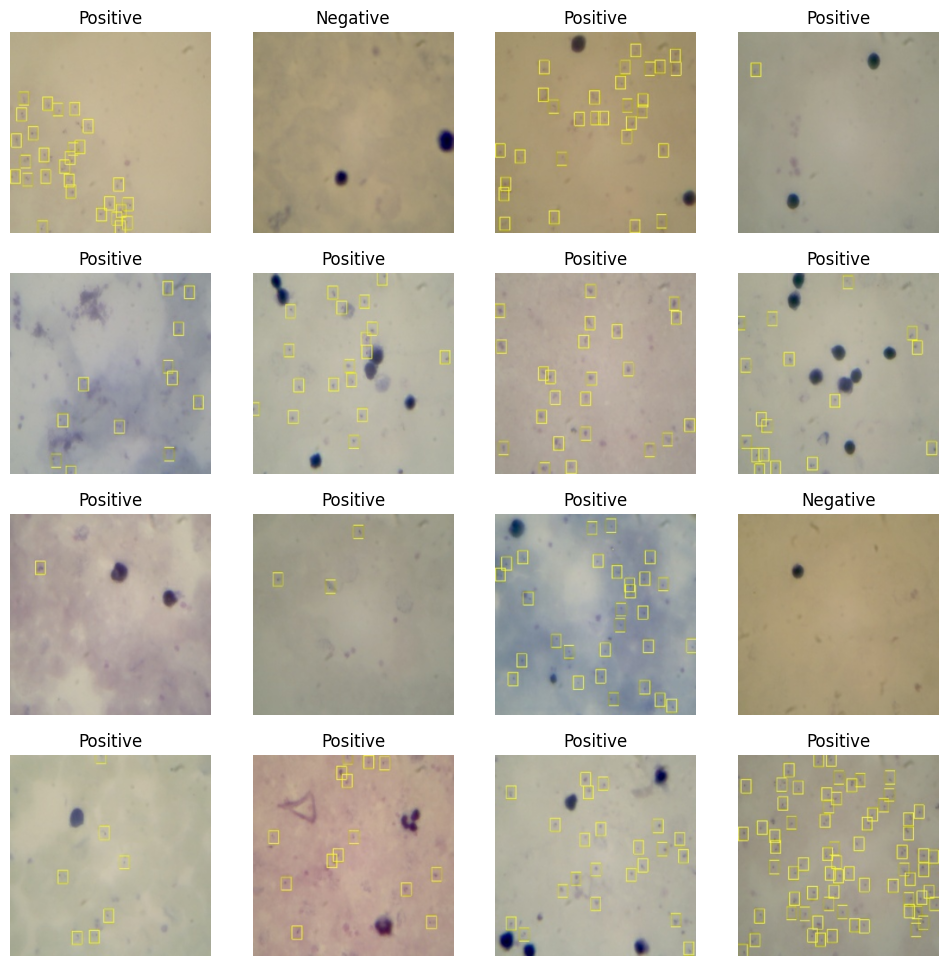

In [ ]:
plt.figure(figsize = (12,12))

for images, labels in train_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.)
    plt.title(CONFIGURATION["CLASS_NAMES"][tf.argmax(labels[i], axis = 0).numpy()])
    plt.axis("off")

## Data Augmentation

In [48]:
### tf.keras.layer augment
augment_layers = tf.keras.Sequential([
  RandomRotation(factor = (-0.025, 0.025)),
  RandomFlip(mode='horizontal',),
  RandomContrast(factor=0.1),
])

In [49]:
def augment_layer(image, label):
  return augment_layers(image, training = True), label

## Dataset Preparation

In [ ]:
# train_dataset_1 = train_dataset.map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)
# train_dataset_2 = train_dataset.map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)

# mixed_dataset = tf.data.Dataset.zip((train_dataset_1, train_dataset_2))

In [ ]:

# training_dataset = (
#     mixed_dataset
#     .map(cutmix, num_parallel_calls = tf.data.AUTOTUNE)
#     .prefetch(tf.data.AUTOTUNE)
# )

In [50]:
training_dataset = (
    train_dataset
    .map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)


In [51]:
validation_dataset = (
    val_dataset
    .prefetch(tf.data.AUTOTUNE)
)

In [52]:
resize_rescale_layers = tf.keras.Sequential([
       Resizing(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]),
       Rescaling(1./255),
])

In [53]:
training_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>

In [54]:
validation_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.float32, name=None))>

# Modeling

# Finetuning a DenseNet

In [40]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet121  # Use DenseNet121

# Define the input layer
input_layer = Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

# Load the DenseNet121 backbone
backbone = DenseNet121(include_top=False, weights='imagenet', input_tensor=input_layer)

# Add custom layers on top of the DenseNet121 backbone
x = backbone.output
x = GlobalAveragePooling2D()(x)
x = Dense(CONFIGURATION["N_DENSE_1"], activation="relu")(x)
x = BatchNormalization()(x)
x = Dense(CONFIGURATION["N_DENSE_2"], activation="relu")(x)
x = BatchNormalization()(x)
output_layer = Dense(CONFIGURATION["NUM_CLASSES"], activation="softmax")(x)

# Define the final model
densenet_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
densenet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
densenet_model.summary()


Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 zero_padding2d_4 (ZeroPadd  (None, 262, 262, 3)          0         ['input_7[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 128, 128, 64)         9408      ['zero_padding2d_4[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1/conv[0][0]']    

In [41]:
loss_function = 'binary_crossentropy'
#loss_function = SparseCategoricalCrossentropy()

metrics = [CategoricalAccuracy(name = "accuracy"), TopKCategoricalAccuracy(k=2, name = "top_k_accuracy"), tf.keras.metrics.Accuracy(name="val_accuracy") ]
# tf.keras.metrics.Accuracy(name="val_accuracy")
# backbone.trainable=False
# resnet_model.compile(
#   optimizer = Adam(learning_rate = CONFIGURATION["LEARNING_RATE"]),
#   loss = loss_function,
#   metrics = metrics,
# )
densenet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = densenet_model.fit(
  training_dataset,
  validation_data= validation_dataset,
  #validation_data = validation_dataset,
  epochs = 10,
  verbose = 1,
  #class_weight = class_weights,
  #callbacks = [WandbCallback(), LogConfMatrix(), LogResultsTable()]
)

Epoch 1/10
84/84 [==============================] - 138s 734ms/step - loss: 0.2998 - accuracy: 0.9380 - val_loss: 0.1884 - val_accuracy: 0.9254
Epoch 2/10
84/84 [==============================] - 52s 596ms/step - loss: 0.1369 - accuracy: 0.9776 - val_loss: 6.6777 - val_accuracy: 0.1660
Epoch 3/10
84/84 [==============================] - 49s 567ms/step - loss: 0.0767 - accuracy: 0.9881 - val_loss: 0.0785 - val_accuracy: 0.9795
Epoch 4/10
84/84 [==============================] - 51s 592ms/step - loss: 0.0447 - accuracy: 0.9955 - val_loss: 0.1720 - val_accuracy: 0.9608
Epoch 5/10
84/84 [==============================] - 49s 568ms/step - loss: 0.0778 - accuracy: 0.9791 - val_loss: 8.4135 - val_accuracy: 0.1306
Epoch 6/10
84/84 [==============================] - 49s 561ms/step - loss: 0.0484 - accuracy: 0.9854 - val_loss: 0.0759 - val_accuracy: 0.9832
Epoch 7/10
84/84 [==============================] - 50s 577ms/step - loss: 0.0519 - accuracy: 0.9892 - val_loss: 0.0200 - val_accuracy: 0.998

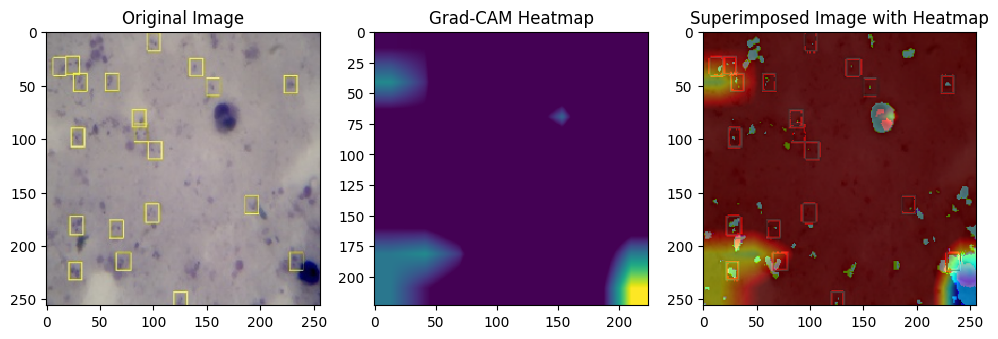

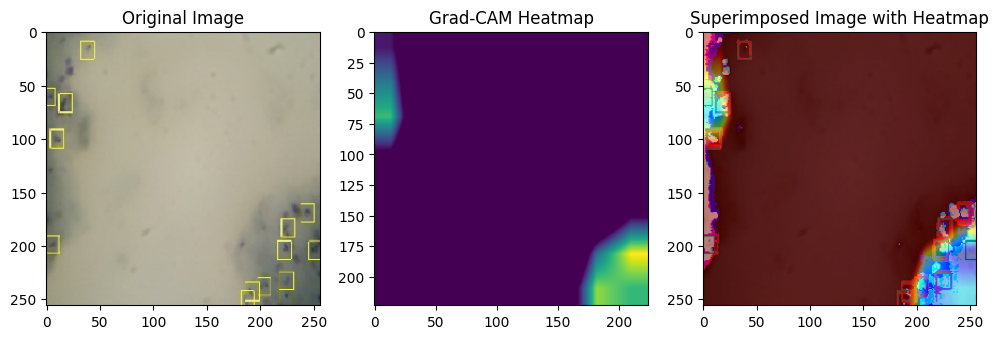

<ipython-input-34-5dbb18449f76>:43: RuntimeWarning: invalid value encountered in divide
  cam = cam / cam.max()
<ipython-input-34-5dbb18449f76>:44: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)


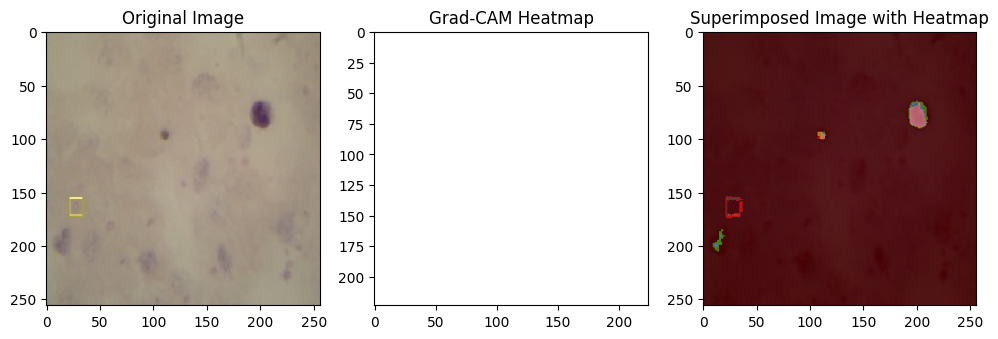

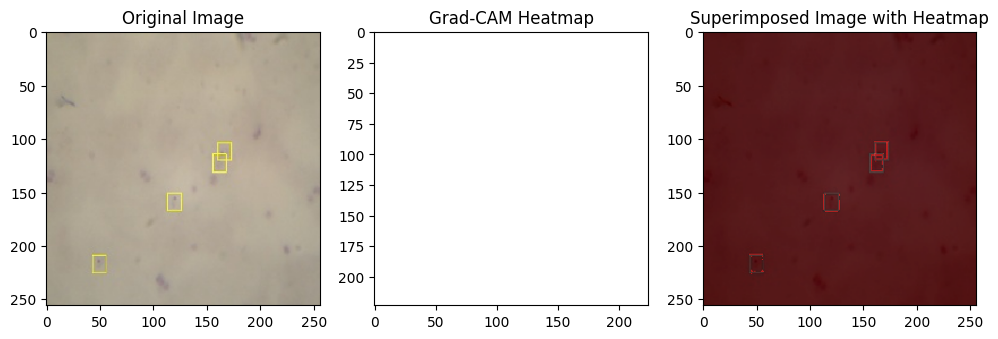

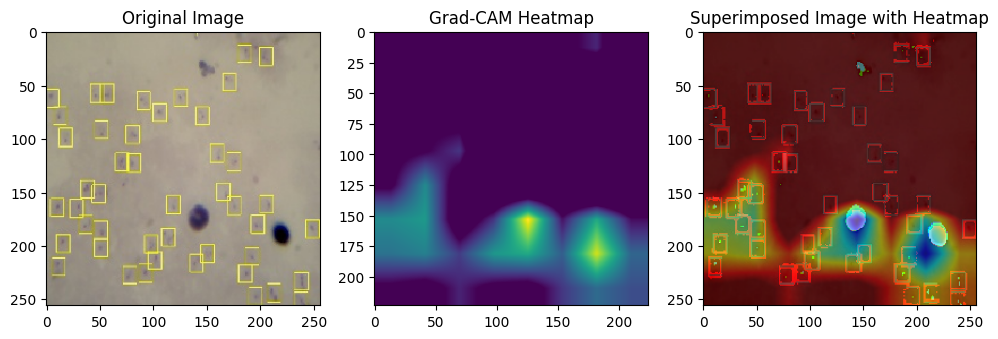

In [34]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/densenet_model.h5"
resnet_model = load_model(resnet_model_path)

# Path to the dataset directory
dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Limit to the first 5 images
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Define the Grad-CAM model
    last_conv_layer = resnet_model.get_layer("conv5_block16_concat")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)

    # Display the visualizations
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name (commented out for display purposes)
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory

    plt.show()  # Display the visualization


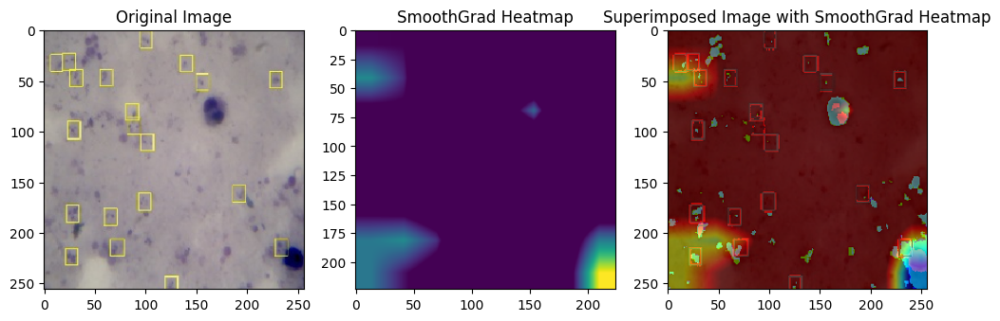

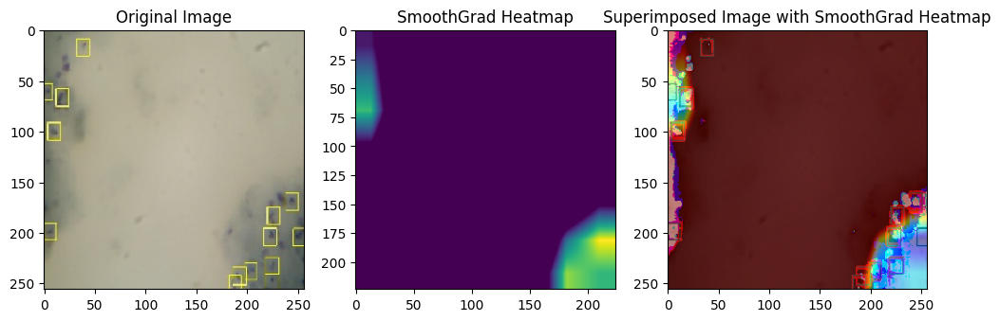

<ipython-input-38-85e854ba01fd>:60: RuntimeWarning: invalid value encountered in divide
  cam = cam / cam.max()
<ipython-input-38-85e854ba01fd>:61: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)


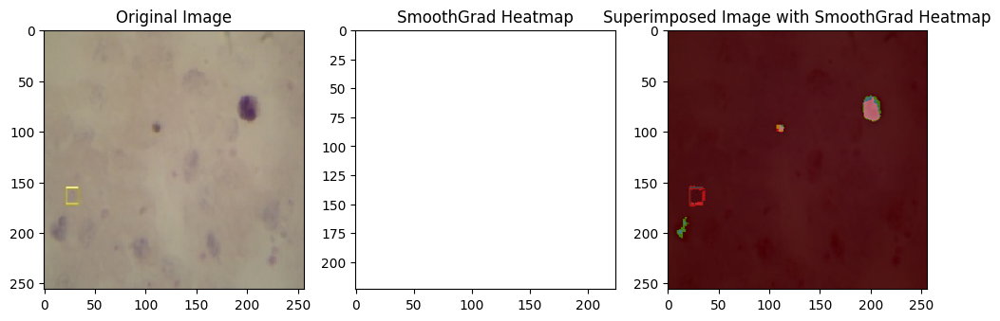

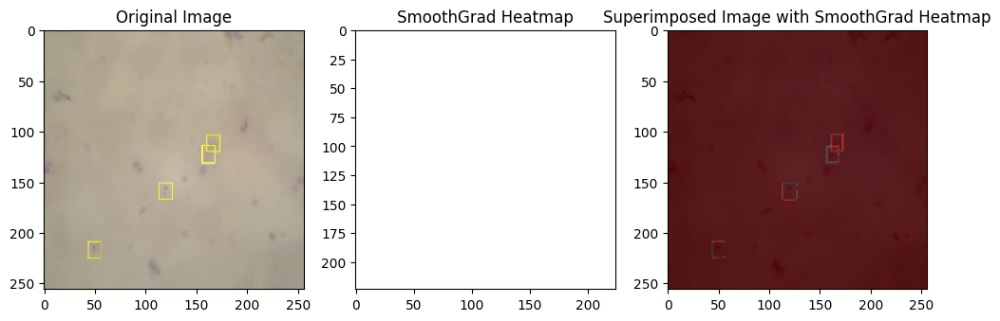

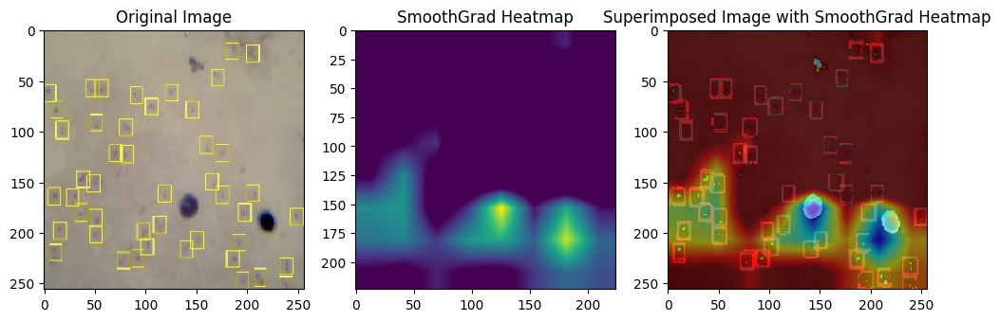

In [38]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/densenet_model.h5"
resnet_model = load_model(resnet_model_path)


dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Define the number of noise samples for SmoothGrad
num_samples = 10
last_conv_layer = resnet_model.get_layer("conv5_block16_concat")
files = files[:5]
for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    # Create a function to generate noisy images
    def generate_noisy_images(input_image, stddev=0.2):
        noise = np.random.normal(0, stddev, input_image.shape)
        noisy_images = input_image + noise
        return noisy_images

        # Generate noisy images for SmoothGrad
    noisy_inputs = generate_noisy_images(x, stddev=0.2)
    noisy_inputs = np.expand_dims(noisy_inputs, axis=0)  # Add batch dimension
    noisy_inputs = np.repeat(noisy_inputs, num_samples, axis=0)  # Repeat for SmoothGrad
    noisy_inputs = noisy_inputs[:, 0, :, :, :]
    # Perform SmoothGrad calculation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(noisy_inputs)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)

    # Average gradients over the noisy samples
    avg_grads = tf.reduce_mean(grads, axis=0)
    weights = tf.reduce_mean(avg_grads, axis=(0, 1))

    # Reshape weights to match the last conv layer output shape
    weights_reshaped = np.expand_dims(weights, axis=(0, 1, 2))  # Adjust dimensions as needed


    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('SmoothGrad Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with SmoothGrad Heatmap')

    plt.show()  # Display the visualization


In [43]:
densenet_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/densenet_model.keras')


# Finetuning  an Inception

In [29]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import InceptionV3  # Use InceptionV3


# Define the input layer
input_layer = Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

# Load the InceptionV3 backbone
backbone = InceptionV3(include_top=False, weights='imagenet', input_tensor=input_layer)

# Add custom layers on top of the InceptionV3 backbone
x = backbone.output
x = GlobalAveragePooling2D()(x)
x = Dense(CONFIGURATION["N_DENSE_1"], activation="relu")(x)
x = BatchNormalization()(x)
x = Dense(CONFIGURATION["N_DENSE_2"], activation="relu")(x)
x = BatchNormalization()(x)
output_layer = Dense(CONFIGURATION["NUM_CLASSES"], activation="softmax")(x)

# Define the final model
inception_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
inception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
inception_model.summary()


87910968/87910968 [==============================] - 1s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 127, 127, 32)         864       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_3 (Bat  (None, 127, 127, 32)         96        ['conv2d[0][0]']              
 chNormalization)                                                                                 
                                                                                                  
 activation (Activation)   

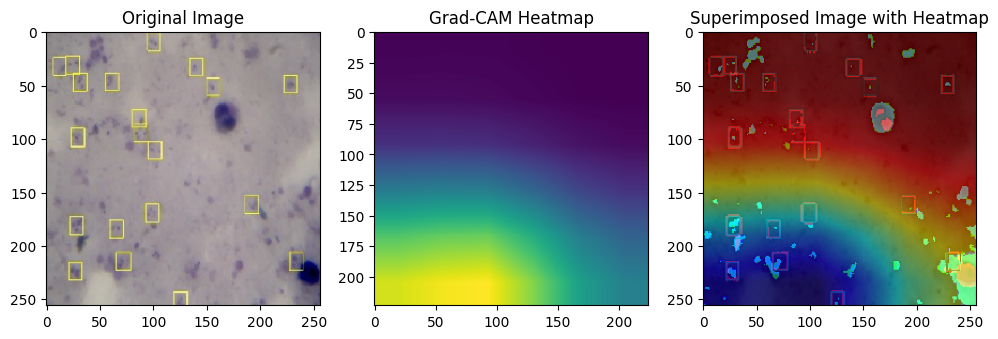

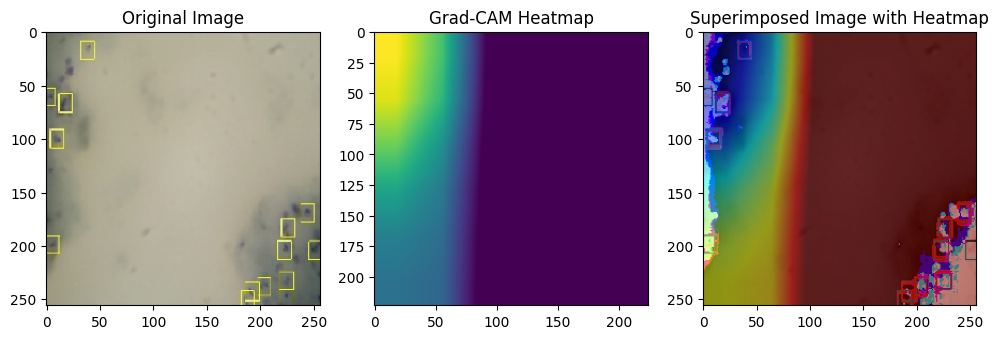

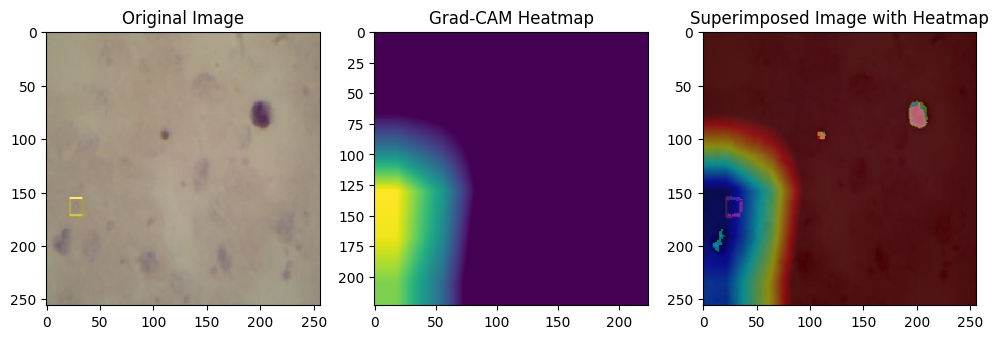

<ipython-input-31-0961681de972>:43: RuntimeWarning: invalid value encountered in divide
  cam = cam / cam.max()
<ipython-input-31-0961681de972>:44: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)


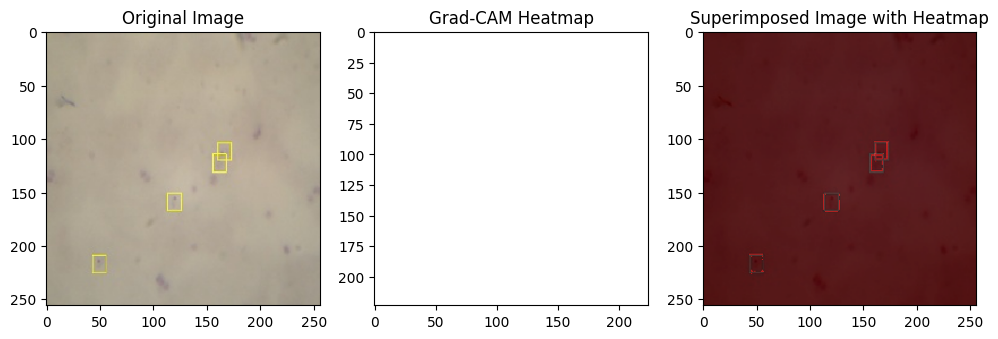

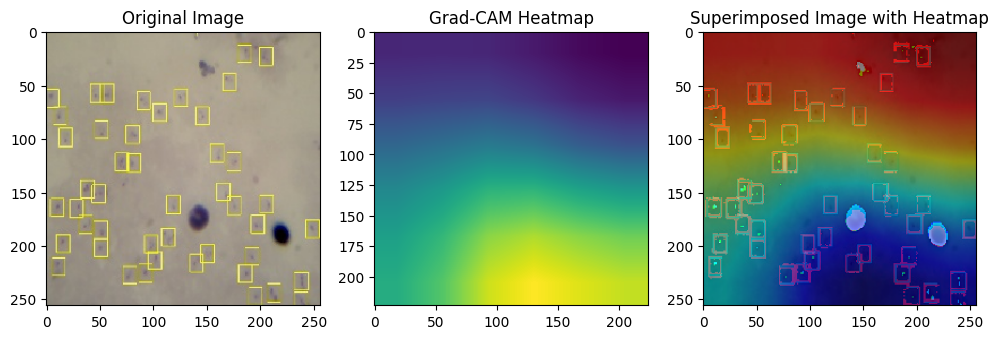

In [31]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/inception_model.h5"
resnet_model = load_model(resnet_model_path)

# Path to the dataset directory
dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Limit to the first 5 images
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Define the Grad-CAM model
    last_conv_layer = resnet_model.get_layer("activation_93")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)

    # Display the visualizations
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name (commented out for display purposes)
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory

    plt.show()  # Display the visualization


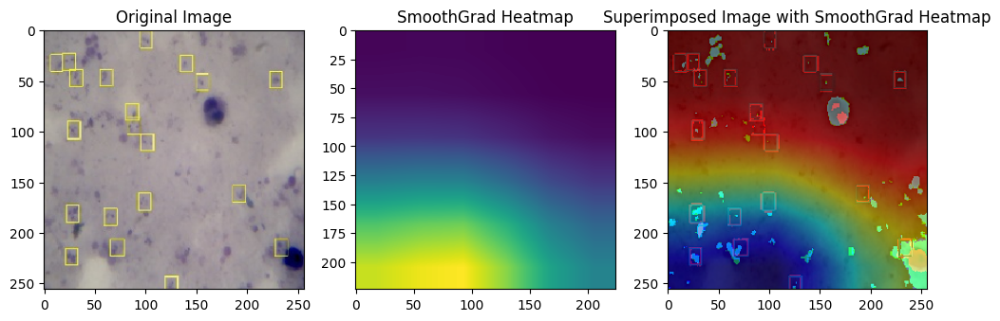

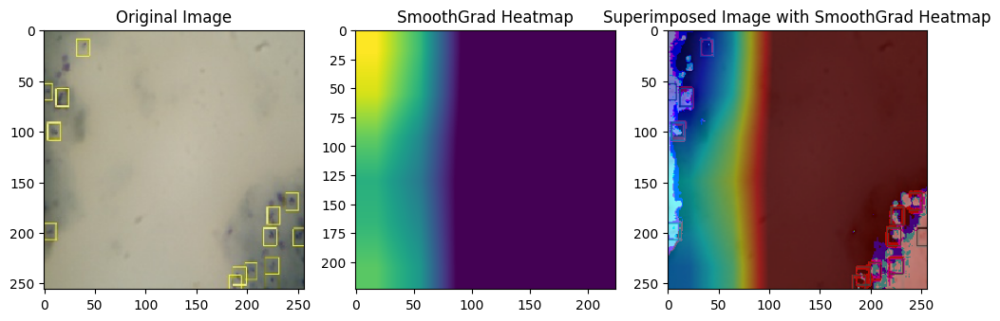

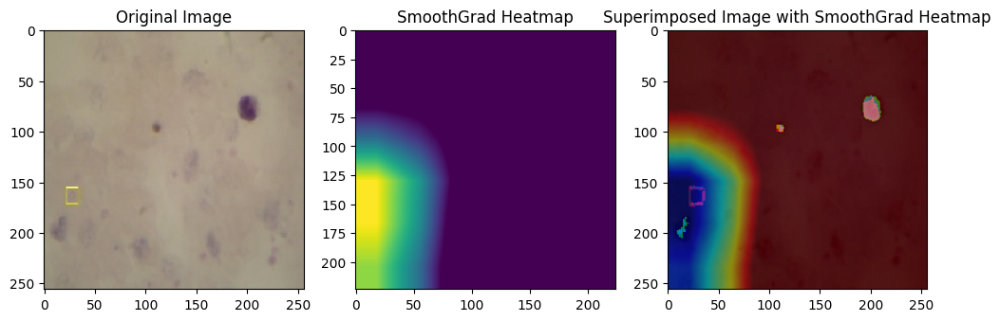

<ipython-input-36-daf682cf9157>:60: RuntimeWarning: invalid value encountered in divide
  cam = cam / cam.max()
<ipython-input-36-daf682cf9157>:61: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)


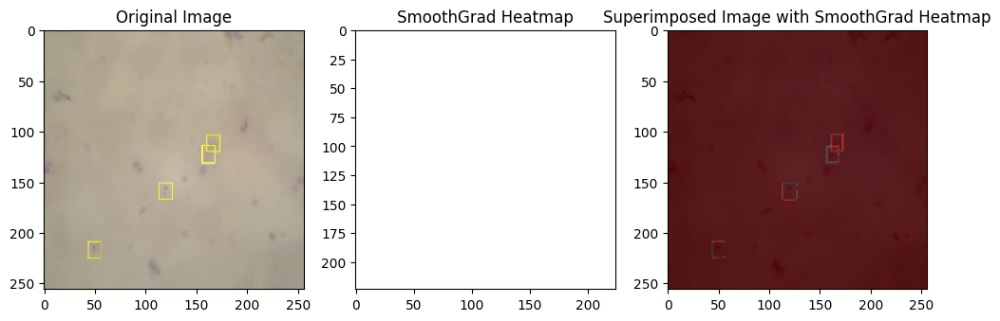

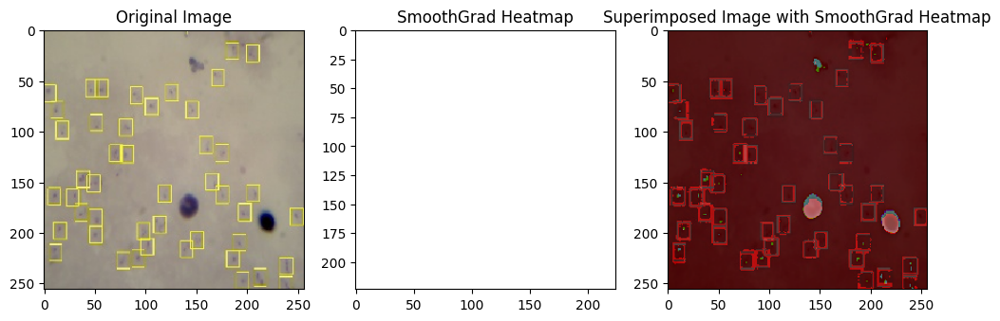

In [36]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/inception_model.h5"
resnet_model = load_model(resnet_model_path)


dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Define the number of noise samples for SmoothGrad
num_samples = 10
last_conv_layer = resnet_model.get_layer("activation_93")
files = files[:5]
for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    # Create a function to generate noisy images
    def generate_noisy_images(input_image, stddev=0.2):
        noise = np.random.normal(0, stddev, input_image.shape)
        noisy_images = input_image + noise
        return noisy_images

        # Generate noisy images for SmoothGrad
    noisy_inputs = generate_noisy_images(x, stddev=0.2)
    noisy_inputs = np.expand_dims(noisy_inputs, axis=0)  # Add batch dimension
    noisy_inputs = np.repeat(noisy_inputs, num_samples, axis=0)  # Repeat for SmoothGrad
    noisy_inputs = noisy_inputs[:, 0, :, :, :]
    # Perform SmoothGrad calculation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(noisy_inputs)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)

    # Average gradients over the noisy samples
    avg_grads = tf.reduce_mean(grads, axis=0)
    weights = tf.reduce_mean(avg_grads, axis=(0, 1))

    # Reshape weights to match the last conv layer output shape
    weights_reshaped = np.expand_dims(weights, axis=(0, 1, 2))  # Adjust dimensions as needed


    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('SmoothGrad Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with SmoothGrad Heatmap')

    plt.show()  # Display the visualization


In [30]:
loss_function = 'binary_crossentropy'
#loss_function = SparseCategoricalCrossentropy()

metrics = [CategoricalAccuracy(name = "accuracy"), TopKCategoricalAccuracy(k=2, name = "top_k_accuracy"), tf.keras.metrics.Accuracy(name="val_accuracy") ]
# tf.keras.metrics.Accuracy(name="val_accuracy")
# backbone.trainable=False
# resnet_model.compile(
#   optimizer = Adam(learning_rate = CONFIGURATION["LEARNING_RATE"]),
#   loss = loss_function,
#   metrics = metrics,
# )

history = inception_model.fit(
  training_dataset,
  validation_data= validation_dataset,
  #validation_data = validation_dataset,
  epochs = 10,
  verbose = 1,
  #class_weight = class_weights,
  #callbacks = [WandbCallback(), LogConfMatrix(), LogResultsTable()]
)

Epoch 1/10
84/84 [==============================] - 112s 792ms/step - loss: 0.3564 - accuracy: 0.9246 - val_loss: 9.3528 - val_accuracy: 0.8899
Epoch 2/10
84/84 [==============================] - 59s 681ms/step - loss: 0.1725 - accuracy: 0.9686 - val_loss: 0.3045 - val_accuracy: 0.8937
Epoch 3/10
84/84 [==============================] - 45s 521ms/step - loss: 0.1260 - accuracy: 0.9713 - val_loss: 0.3221 - val_accuracy: 0.8974
Epoch 4/10
84/84 [==============================] - 48s 552ms/step - loss: 0.0636 - accuracy: 0.9858 - val_loss: 0.0514 - val_accuracy: 0.9963
Epoch 5/10
84/84 [==============================] - 46s 531ms/step - loss: 0.0410 - accuracy: 0.9933 - val_loss: 0.0240 - val_accuracy: 0.9981
Epoch 6/10
84/84 [==============================] - 46s 529ms/step - loss: 0.0427 - accuracy: 0.9903 - val_loss: 2.3350 - val_accuracy: 0.8937
Epoch 7/10
84/84 [==============================] - 46s 530ms/step - loss: 0.0428 - accuracy: 0.9892 - val_loss: 0.3213 - val_accuracy: 0.893

In [44]:
inception_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/inception_model.h5')
inception_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/inception_model.keras')

## Lenet

In [ ]:
lenet_model = tf.keras.Sequential(
    [
    InputLayer(input_shape = (None, None, 3), ),

    resize_rescale_layers,

    Conv2D(filters = CONFIGURATION["N_FILTERS"] , kernel_size = CONFIGURATION["KERNEL_SIZE"], strides = CONFIGURATION["N_STRIDES"] , padding='valid',
          activation = 'relu',kernel_regularizer = L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D (pool_size = CONFIGURATION["POOL_SIZE"], strides= CONFIGURATION["N_STRIDES"]*2),
    Dropout(rate = CONFIGURATION["DROPOUT_RATE"] ),

    Conv2D(filters = CONFIGURATION["N_FILTERS"]*2 + 4, kernel_size = CONFIGURATION["KERNEL_SIZE"], strides=CONFIGURATION["N_STRIDES"], padding='valid',
          activation = 'relu', kernel_regularizer = L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    MaxPool2D (pool_size = CONFIGURATION["POOL_SIZE"], strides= CONFIGURATION["N_STRIDES"]*2),

    Flatten(),

    Dense( CONFIGURATION["N_DENSE_1"], activation = "relu", kernel_regularizer = L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),
    Dropout(rate = CONFIGURATION["DROPOUT_RATE"]),

    Dense( CONFIGURATION['N_DENSE_2'], activation = "relu", kernel_regularizer = L2(CONFIGURATION["REGULARIZATION_RATE"])),
    BatchNormalization(),

    Dense(CONFIGURATION["NUM_CLASSES"], activation = "softmax"),

])

lenet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_36 (Conv2D)          (None, 254, 254, 6)       168       
                                                                 
 batch_normalization_36 (Ba  (None, 254, 254, 6)       24        
 tchNormalization)                                               
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 127, 127, 6)       0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 127, 127, 6)       0         
                                                                 
 conv2d_37 (Conv2D)          (None, 125, 125, 16)     

# Fine tuning a ResNet34

### CustomConv2D

In [ ]:
class CustomConv2D(Layer):
  def __init__(self, n_filters, kernel_size, n_strides, padding = 'valid'):
    super(CustomConv2D, self).__init__(name = 'custom_conv2d')

    self.conv = Conv2D(
        filters = n_filters,
        kernel_size = kernel_size,
        activation = 'relu',
        strides = n_strides,
        padding = padding)

    self.batch_norm = BatchNormalization()

  def call(self, x, training = True):

    x = self.conv(x)
    x = self.batch_norm(x, training)

    return x

### Residual Block

In [ ]:
class ResidualBlock(Layer):
  def __init__(self, n_channels, n_strides = 1):
    super(ResidualBlock, self).__init__(name = 'res_block')

    self.dotted = (n_strides != 1)

    self.custom_conv_1 = CustomConv2D(n_channels, 3, n_strides, padding = "same")
    self.custom_conv_2 = CustomConv2D(n_channels, 3, 1, padding = "same")

    self.activation = Activation('relu')

    if self.dotted:
      self.custom_conv_3 = CustomConv2D(n_channels, 1, n_strides)

  def call(self, input, training):

    x = self.custom_conv_1(input, training)
    x = self.custom_conv_2(x, training)

    if self.dotted:
      x_add = self.custom_conv_3(input, training)
      x_add = Add()([x, x_add])
    else:
      x_add = Add()([x, input])

    return self.activation(x_add)


### Complete Network

In [20]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50  # You can use ResNet50, ResNet101, etc.


# Define the input layer
input_layer = Input(shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

# Load the ResNet backbone
backbone = ResNet50(include_top=False, weights='imagenet', input_tensor=input_layer)

# Add custom layers on top of the ResNet backbone
x = backbone.output
x = GlobalAveragePooling2D()(x)
x = Dense(CONFIGURATION["N_DENSE_1"], activation="relu")(x)
x = BatchNormalization()(x)
x = Dense(CONFIGURATION["N_DENSE_2"], activation="relu")(x)
x = BatchNormalization()(x)
output_layer = Dense(CONFIGURATION["NUM_CLASSES"], activation="softmax")(x)

# Define the final model
resnet_model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Summary of the model
resnet_model.summary()


94765736/94765736 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                         

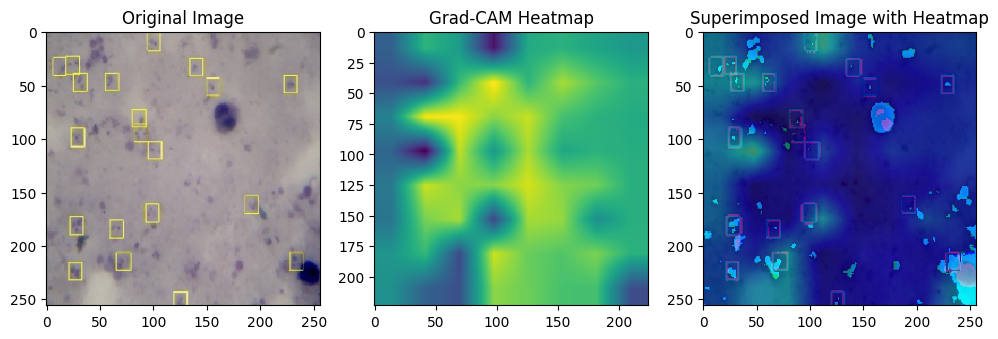

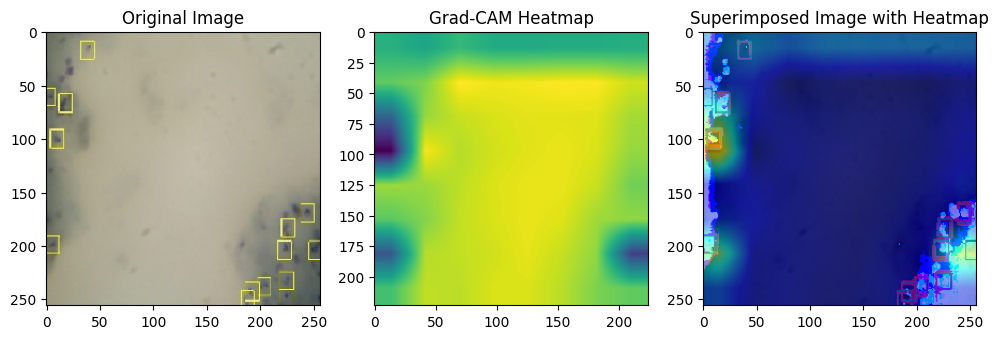

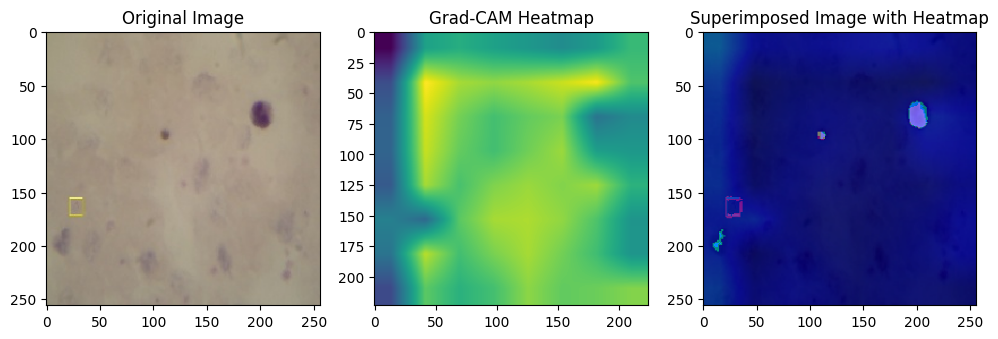

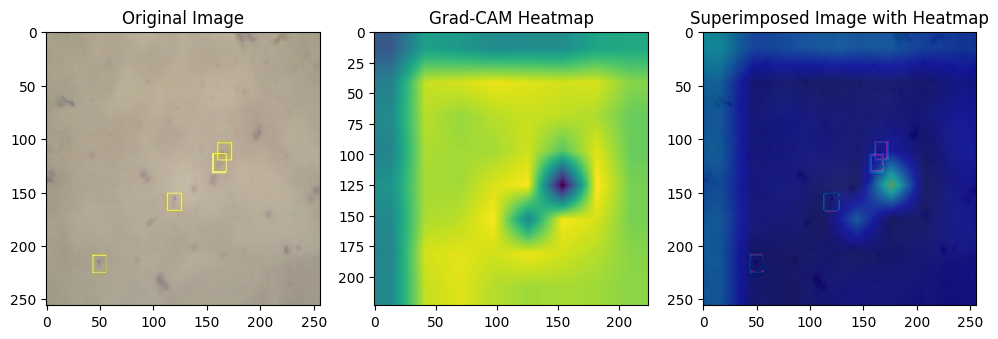

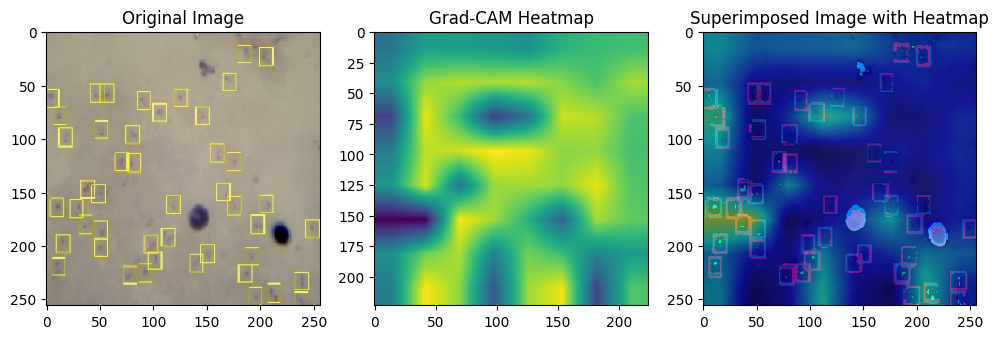

In [26]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
resnet_model_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/resnet_model.h5'
resnet_model = load_model(resnet_model_path)

# Path to the dataset directory
dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Limit to the first 5 images
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Define the Grad-CAM model
    last_conv_layer = resnet_model.get_layer("conv5_block3_out")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)

    # Display the visualizations
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name (commented out for display purposes)
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory

    plt.show()  # Display the visualization


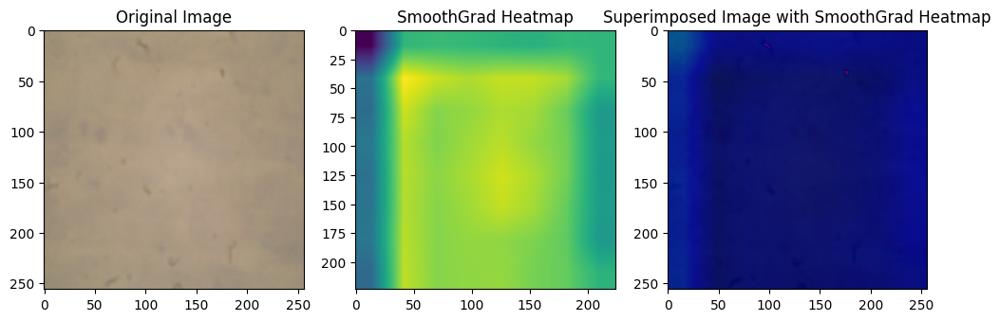

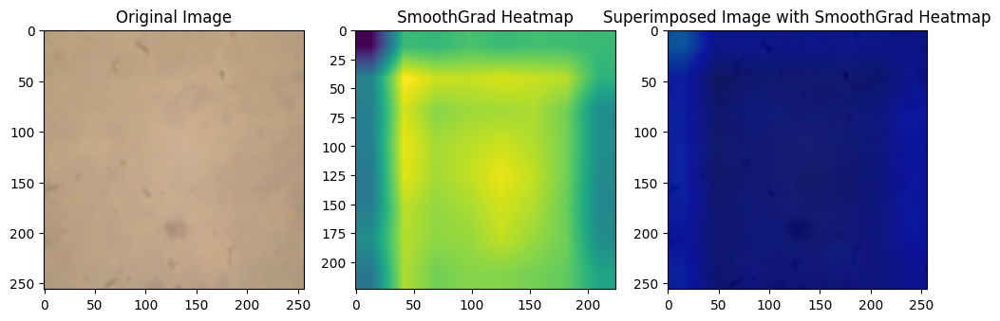

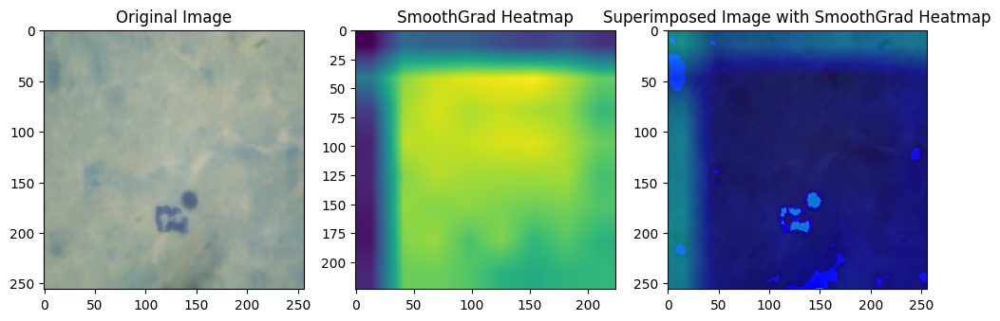

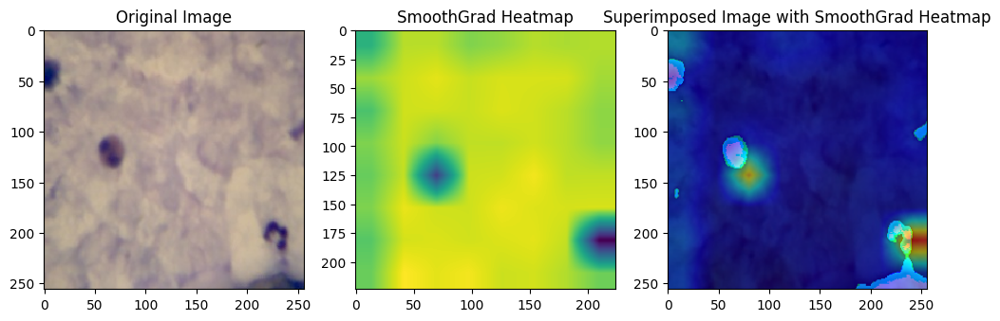

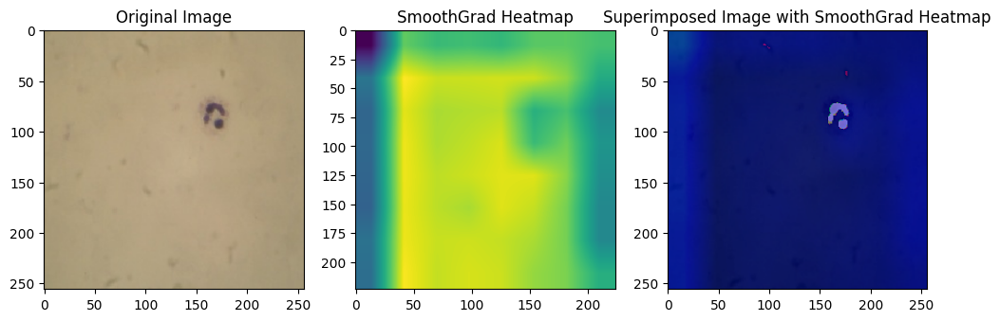

In [29]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/resnet_model.h5"
resnet_model = load_model(resnet_model_path)


dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative'
files = os.listdir(dir_path)

# Define the number of noise samples for SmoothGrad
num_samples = 10
last_conv_layer = resnet_model.get_layer("conv5_block3_out")
files = files[:5]
for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    # Create a function to generate noisy images
    def generate_noisy_images(input_image, stddev=0.2):
        noise = np.random.normal(0, stddev, input_image.shape)
        noisy_images = input_image + noise
        return noisy_images

        # Generate noisy images for SmoothGrad
    noisy_inputs = generate_noisy_images(x, stddev=0.2)
    noisy_inputs = np.expand_dims(noisy_inputs, axis=0)  # Add batch dimension
    noisy_inputs = np.repeat(noisy_inputs, num_samples, axis=0)  # Repeat for SmoothGrad
    noisy_inputs = noisy_inputs[:, 0, :, :, :]
    # Perform SmoothGrad calculation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(noisy_inputs)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)

    # Average gradients over the noisy samples
    avg_grads = tf.reduce_mean(grads, axis=0)
    weights = tf.reduce_mean(avg_grads, axis=(0, 1))

    # Reshape weights to match the last conv layer output shape
    weights_reshaped = np.expand_dims(weights, axis=(0, 1, 2))  # Adjust dimensions as needed


    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('SmoothGrad Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with SmoothGrad Heatmap')

    plt.show()  # Display the visualization


In [22]:
loss_function = 'categorical_crossentropy'
#loss_function = SparseCategoricalCrossentropy()

metrics = [CategoricalAccuracy(name = "accuracy"), TopKCategoricalAccuracy(k=2, name = "top_k_accuracy"), tf.keras.metrics.Accuracy(name="val_accuracy") ]
# tf.keras.metrics.Accuracy(name="val_accuracy")
# backbone.trainable=False
# resnet_model.compile(
#   optimizer = Adam(learning_rate = CONFIGURATION["LEARNING_RATE"]),
#   loss = loss_function,
#   metrics = metrics,
# )

history = resnet_model.fit(
  training_dataset,
  validation_data= validation_dataset,
  #validation_data = validation_dataset,
  epochs = 10,
  verbose = 1,
  #class_weight = class_weights,
  #callbacks = [WandbCallback(), LogConfMatrix(), LogResultsTable()]
)

Epoch 1/10
84/84 [==============================] - 818s 8s/step - loss: 0.3453 - accuracy: 0.9104 - val_loss: 5.3464 - val_accuracy: 0.8937
Epoch 2/10
84/84 [==============================] - 46s 525ms/step - loss: 0.1848 - accuracy: 0.9515 - val_loss: 0.2209 - val_accuracy: 0.8881
Epoch 3/10
84/84 [==============================] - 45s 518ms/step - loss: 0.1540 - accuracy: 0.9586 - val_loss: 0.3724 - val_accuracy: 0.9272
Epoch 4/10
84/84 [==============================] - 47s 548ms/step - loss: 0.0325 - accuracy: 0.9981 - val_loss: 0.1812 - val_accuracy: 0.8937
Epoch 5/10
84/84 [==============================] - 45s 515ms/step - loss: 0.0616 - accuracy: 0.9873 - val_loss: 0.7617 - val_accuracy: 0.8937
Epoch 6/10
84/84 [==============================] - 45s 515ms/step - loss: 0.0493 - accuracy: 0.9903 - val_loss: 0.2114 - val_accuracy: 0.8993
Epoch 7/10
84/84 [==============================] - 45s 513ms/step - loss: 0.0208 - accuracy: 0.9959 - val_loss: 0.0113 - val_accuracy: 0.9981
E

In [45]:
resnet_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/resnet_model.h5')
resnet_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/resnet_model.keras')

## Transfer Learning with EfficientNet

In [ ]:
backbone = tf.keras.applications.efficientnet.EfficientNetB4(
    include_top = False,
    weights='imagenet',
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
    )

71686520/71686520 [==============================] - 0s 0us/step


In [ ]:
backbone.trainable = False

In [ ]:
pretrained_model = tf.keras.Sequential([
    Input(shape = (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"],3)),
    backbone,
    GlobalAveragePooling2D(),
    Dense( CONFIGURATION["N_DENSE_1"], activation = "relu"),
    BatchNormalization(),
    Dense( CONFIGURATION["N_DENSE_2"], activation = "relu"),
    Dense( CONFIGURATION["NUM_CLASSES"], activation = "softmax"),

    ])
pretrained_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb4 (Functional  (None, 8, 8, 1792)        17673823  
 )                                                               
                                                                 
 global_average_pooling2d (  (None, 1792)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              1836032   
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 128)               131200    
                                                      

## Transfer Learning with MobileNetV2

In [ ]:
backbone = tf.keras.applications.mobilenet_v2.MobileNetV2(
    include_top = False,
    weights='imagenet',
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
    )

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
backbone.trainable = False

In [ ]:
pretrained_model = tf.keras.Sequential([
    Input(shape = (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"],3)),
    backbone,
    GlobalAveragePooling2D(),
    Dense( CONFIGURATION["N_DENSE_1"], activation = "relu"),
    BatchNormalization(),
    Dense( CONFIGURATION["N_DENSE_2"], activation = "relu"),
    Dense( CONFIGURATION["NUM_CLASSES"], activation = "softmax"),

    ])
pretrained_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 8, 8, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_13 (Dense)            (None, 1024)              1311744   
                                                                 
 batch_normalization_40 (Ba  (None, 1024)              4096      
 tchNormalization)                                               
                                                                 
 dense_14 (Dense)            (None, 128)               131200    
                                                      

## Finetuning CNN

In [ ]:
backbone.trainable = True

In [60]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization
from tensorflow.keras.applications import EfficientNetB0

def create_cnn_branch(input_shape=(256, 256, 3), num_classes=10):
    # Define the input layer
    input = Input(shape=input_shape)

    # Add the convolutional layers with max pooling
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    # Add global average pooling
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dense(64, activation='relu')(x)
    output = Dense(num_classes, activation='softmax')(x)

    # Create the CNN branch model
    cnn_branch_model = Model(inputs=input, outputs=output)
    return cnn_branch_model



cnn_model = create_cnn_branch(input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
                                     num_classes=CONFIGURATION["NUM_CLASSES"])

# Display model summary
cnn_model.summary()


Model: "model_160"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_17 (Conv2D)          (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 128, 128, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_18 (Conv2D)          (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 64, 64, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 64, 64, 128)       73

In [ ]:
tf.config.set_soft_device_placement(True)
cnn_model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

history = cnn_model.fit(
  training_dataset,
  validation_data= validation_dataset,
  #validation_data = validation_dataset,
  epochs = 10,
  verbose = 1,
  #class_weight = class_weights,
  #callbacks = [WandbCallback(), LogConfMatrix(), LogResultsTable()]
)
model_save_path = 'content/drive/MyDrive/DATASETS/Annotated_Folder/cnn_model.h5'
cnn_model.save(model_save_path)


Epoch 1/10
84/84 [==============================] - 803s 9s/step - loss: 0.3353 - accuracy: 0.8899 - val_loss: 1.3225 - val_accuracy: 0.8937
Epoch 2/10
84/84 [==============================] - 485s 6s/step - loss: 0.2406 - accuracy: 0.9130 - val_loss: 3.0911 - val_accuracy: 0.1063
Epoch 3/10
84/84 [==============================] - 477s 6s/step - loss: 0.2114 - accuracy: 0.9227 - val_loss: 0.6111 - val_accuracy: 0.9328
Epoch 4/10
84/84 [==============================] - 489s 6s/step - loss: 0.2039 - accuracy: 0.9186 - val_loss: 3.0330 - val_accuracy: 0.1474
Epoch 5/10
84/84 [==============================] - 477s 6s/step - loss: 0.1938 - accuracy: 0.9291 - val_loss: 2.3622 - val_accuracy: 0.8937
Epoch 6/10
84/84 [==============================] - 491s 6s/step - loss: 0.1997 - accuracy: 0.9242 - val_loss: 1.9430 - val_accuracy: 0.8937
Epoch 7/10
38/84 [============>.................] - ETA: 4:25 - loss: 0.1708 - accuracy: 0.9293

In [39]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
resnet_model_path = "/content/drive/MyDrive/DATASETS/Annotated_Folder/cnn_model.h5"
resnet_model = load_model(resnet_model_path)

# Path to the dataset directory
dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive'
files = os.listdir(dir_path)

# Limit to the first 5 images
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Define the Grad-CAM model
    last_conv_layer = resnet_model.get_layer("efficientnetb0")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)

    # Display the visualizations
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name (commented out for display purposes)
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory

    plt.show()  # Display the visualization


ValueError: Graph disconnected: cannot obtain value for tensor KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'") at layer "rescaling_1". The following previous layers were accessed without issue: []

In [46]:
cnn_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/cnn_model.h5')
cnn_model.save('/content/drive/MyDrive/DATASETS/Annotated_Folder/cnn_model.keras')


## FineTuning EficientNet

In [ ]:
backbone.trainable = True

In [ ]:
input = Input(shape = (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"],3))

x = backbone(input, training = False)
x = GlobalAveragePooling2D()(x)
x = Dense( CONFIGURATION["N_DENSE_1"], activation = "relu")(x)
x = BatchNormalization()(x)
x = Dense( CONFIGURATION["N_DENSE_2"], activation = "relu")(x)
output = Dense( CONFIGURATION["NUM_CLASSES"], activation = "softmax")(x)

finetuned_model = Model(input, output)

In [ ]:
finetuned_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 efficientnetb4 (Functional  (None, 8, 8, 1792)        17673823  
 )                                                               
                                                                 
 global_average_pooling2d_2  (None, 1792)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 1024)              1836032   
                                                                 
 batch_normalization_2 (Bat  (None, 1024)              4096      
 chNormalization)                                                
                                                           

## Vision Transformers

### Patch Encoder

In [ ]:
test_image = cv2.imread('/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive/plasmodium-0000.jpg')
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))

In [ ]:
patches = tf.image.extract_patches(images=tf.expand_dims(test_image, axis = 0),
                           sizes=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
                           strides=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
                           rates=[1, 1, 1, 1],
                           padding='VALID')

In [ ]:
print(patches.shape)
patches = tf.reshape(patches, (patches.shape[0], -1, 768))
print(patches.shape)

(1, 16, 16, 768)
(1, 256, 768)


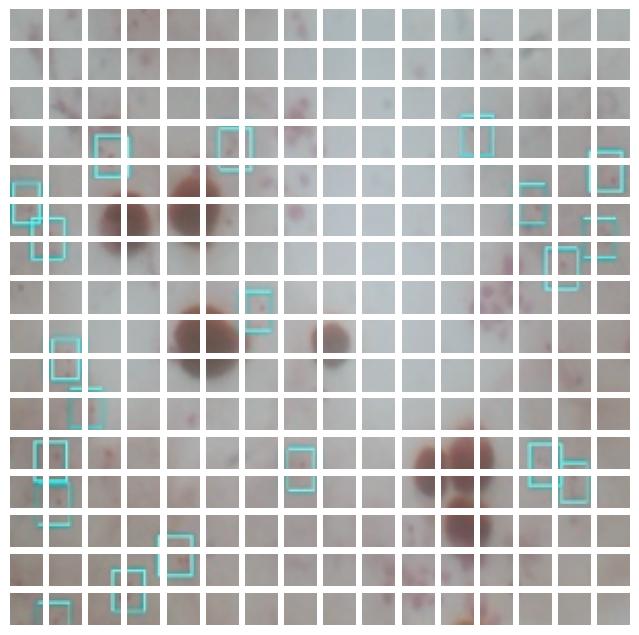

In [ ]:
plt.figure(figsize = (8,8))

for i in range(patches.shape[1]):

    ax = plt.subplot(16,16, i+1)
    plt.imshow(tf.reshape(patches[0,i,:], (16,16,3)))
    plt.axis("off")

In [ ]:
class PatchEncoder(Layer):
  def __init__(self, N_PATCHES, HIDDEN_SIZE):
    super(PatchEncoder, self).__init__(name = 'patch_encoder')

    self.linear_projection = Dense(HIDDEN_SIZE)
    self.positional_embedding = Embedding(N_PATCHES, HIDDEN_SIZE )
    self.N_PATCHES = N_PATCHES

  def call(self, x):
    patches = tf.image.extract_patches(
        images=x,
        sizes=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
        strides=[1, CONFIGURATION["PATCH_SIZE"], CONFIGURATION["PATCH_SIZE"], 1],
        rates=[1, 1, 1, 1],
        padding='VALID')

    patches = tf.reshape(patches, (tf.shape(patches)[0], 256, patches.shape[-1]))

    embedding_input = tf.range(start = 0, limit = self.N_PATCHES, delta = 1 )
    output = self.linear_projection(patches) + self.positional_embedding(embedding_input)

    return output

### TransformerEncoder

In [ ]:
class TransformerEncoder(Layer):
  def __init__(self, N_HEADS, HIDDEN_SIZE):
    super(TransformerEncoder, self).__init__(name = 'transformer_encoder')

    self.layer_norm_1 = LayerNormalization()
    self.layer_norm_2 = LayerNormalization()

    self.multi_head_att = MultiHeadAttention(N_HEADS, HIDDEN_SIZE )

    self.dense_1 = Dense(HIDDEN_SIZE, activation = tf.nn.gelu)
    self.dense_2 = Dense(HIDDEN_SIZE, activation = tf.nn.gelu)

  def call(self, input):
    x_1 = self.layer_norm_1(input)
    x_1 = self.multi_head_att(x_1, x_1)

    x_1 = Add()([x_1, input])

    x_2 = self.layer_norm_2(x_1)
    x_2 = self.dense_1(x_2)
    output = self.dense_2(x_2)
    output = Add()([output, x_1])

    return output

### ViT Model

In [ ]:
class ViT(Model):
  def __init__(self, N_HEADS, HIDDEN_SIZE, N_PATCHES, N_LAYERS, N_DENSE_UNITS):
    super(ViT, self).__init__(name = 'vision_transformer')
    self.N_LAYERS = N_LAYERS
    self.patch_encoder = PatchEncoder(N_PATCHES, HIDDEN_SIZE)
    self.trans_encoders = [TransformerEncoder(N_HEADS, HIDDEN_SIZE) for _ in range(N_LAYERS)]
    self.dense_1 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_2 = Dense(N_DENSE_UNITS, tf.nn.gelu)
    self.dense_3 = Dense(CONFIGURATION["NUM_CLASSES"], activation = 'softmax')
  def call(self, input, training = True):

    x = self.patch_encoder(input)

    for i in range(self.N_LAYERS):
      x = self.trans_encoders[i](x)
    x = Flatten()(x)
    x = self.dense_1(x)
    x = self.dense_2(x)

    return self.dense_3(x)

In [ ]:
vit = ViT(
    N_HEADS = 4, HIDDEN_SIZE = 768, N_PATCHES = 256,
    N_LAYERS = 2, N_DENSE_UNITS = 128)
vit(tf.zeros([2,256,256,3]))

<tf.Tensor: shape=(2, 2), dtype=float32, numpy=
array([[0.5003197 , 0.49968028],
       [0.5003197 , 0.49968028]], dtype=float32)>

In [ ]:
vit.summary()

Model: "vision_transformer"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 patch_encoder (PatchEncode  multiple                  787200    
 r)                                                              
                                                                 
 transformer_encoder (Trans  multiple                  10631424  
 formerEncoder)                                                  
                                                                 
 transformer_encoder (Trans  multiple                  10631424  
 formerEncoder)                                                  
                                                                 
 dense_5 (Dense)             multiple                  25165952  
                                                                 
 dense_6 (Dense)             multiple                  16512     
                                                

## HuggingFace ViT

### Installation

In [ ]:
!pip install transformers

### Training

In [ ]:
resize_rescale_hf = tf.keras.Sequential([
       Resizing(224, 224),
       Rescaling(1./255),
       Permute((3,1,2))
])

In [ ]:
from transformers import ViTFeatureExtractor, TFViTModel


base_model = TFViTModel.from_pretrained("google/vit-base-patch16-224-in21k")

inputs = Input(shape = (256,256,3))
x = resize_rescale_hf(inputs)
x = base_model.vit(x)[0][:,0,:]
#print(x)
output = Dense(CONFIGURATION["NUM_CLASSES"], activation = 'softmax')(x)

hf_model = tf.keras.Model(inputs=inputs, outputs=output)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


In [ ]:
test_image = cv2.imread('/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive/plasmodium-0000.jpg')
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))

In [ ]:
hf_model(tf.expand_dims(test_image, axis = 0))

<tf.Tensor: shape=(1, 2), dtype=float32, numpy=array([[0.510458, 0.489542]], dtype=float32)>

In [ ]:
hf_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 sequential_3 (Sequential)   (None, 3, 224, 224)          0         ['input_3[0][0]']             
                                                                                                  
 tf.compat.v1.transpose (TF  (None, 224, 224, 3)          0         ['sequential_3[0][0]']        
 OpLambda)                                                                                        
                                                                                                  
 tf.compat.v1.shape (TFOpLa  (4,)                         0         ['sequential_3[0][0]']    

### Get Attention Maps

In [ ]:
from transformers import ViTFeatureExtractor, TFViTModel, ViTConfig

configuration = ViTConfig()
configuration.output_attentions = True

base_model = TFViTModel.from_pretrained(
    pretrained_model_name_or_path = "google/vit-base-patch16-224-in21k",
    config = configuration,
    )
inputs = Input(shape = (256,256,3))
x = resize_rescale_hf(inputs)
x = base_model.vit(x)['attentions']

model = tf.keras.Model(inputs=inputs, outputs=x)

All PyTorch model weights were used when initializing TFViTModel.

All the weights of TFViTModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTModel for predictions without further training.


# Training

## Class Weighting

In [ ]:
n_sample_0 = 1525 # angry
n_sample_1 = 3019 # happy
n_sample_2 = 2255 # sad


In [ ]:
class_weights = {0:6799/n_sample_0, 1: 6799/n_sample_1, 2: 6799/n_sample_2}

In [ ]:
print(class_weights)

{0: 4.458360655737705, 1: 2.2520702219277906, 2: 3.015077605321508}


## Callbacks

In [ ]:
checkpoint_callback = ModelCheckpoint(
    'best_weights',
    monitor='val_accuracy',
    mode = 'max',
    verbose=1,
    save_best_only=True,

    )

In [ ]:
class LogConfMatrix(Callback):
  def on_epoch_end(self, epoch, logs):
    predicted = []
    labels = []

    for im, label in validation_dataset:
      predicted.append(hf_model(im))
      labels.append(label.numpy())

    pred = np.concatenate([np.argmax(predicted[:-1], axis = -1).flatten(), np.argmax(predicted[-1], axis = -1).flatten()])
    lab = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(labels[-1], axis = -1).flatten()])

    cm = wandb.plot.confusion_matrix(
        y_true=lab,
        preds=pred,
        class_names=CONFIGURATION["CLASS_NAMES"])

    wandb.log({"conf_mat": cm})

In [ ]:
class LogResultsTable(Callback):
  def on_epoch_end(self, epoch, logs):

    columns=["image", "Predicted", "Label"]

    val_table = wandb.Table(columns = columns)


    for im, label in validation_dataset.take(25):

      pred = CONFIGURATION["CLASS_NAMES"][tf.argmax(hf_model(im), axis = -1).numpy()[0]]
      label = CONFIGURATION["CLASS_NAMES"][tf.argmax(label, axis = -1).numpy()[0]]

      row = [wandb.Image(im), pred, label]

      val_table.add_data(*row)


    wandb.log({"Model Results" : val_table})


## Train

### EfficientNet

In [ ]:
loss_function = 'binary_crossentropy'
#loss_function = SparseCategoricalCrossentropy()


In [ ]:

metrics = [CategoricalAccuracy(name = "accuracy"), TopKCategoricalAccuracy(k=2, name = "top_k_accuracy"), tf.keras.metrics.Accuracy(name="val_accuracy") ]
# tf.keras.metrics.Accuracy(name="val_accuracy")


In [ ]:
backbone.trainable=False


In [ ]:
pretrained_model.compile(
  optimizer = Adam(learning_rate = CONFIGURATION["LEARNING_RATE"]),
  loss = loss_function,
  metrics = metrics,
)


In [ ]:

history = pretrained_model.fit(
  training_dataset,
  validation_data= validation_dataset,
  #validation_data = validation_dataset,
  epochs = CONFIGURATION["N_EPOCHS"],
  verbose = 1,
  #class_weight = class_weights,
  #callbacks = [WandbCallback(), LogConfMatrix(), LogResultsTable()]
)

Epoch 1/20
67/67 [==============================] - 363s 5s/step - loss: 0.1341 - accuracy: 0.9627 - top_k_accuracy: 1.0000 - val_accuracy: 0.9944 - val_loss: 0.0155 - val_top_k_accuracy: 1.0000 - val_val_accuracy: 0.0000e+00
Epoch 2/20
67/67 [==============================] - 30s 437ms/step - loss: 0.0329 - accuracy: 0.9916 - top_k_accuracy: 1.0000 - val_accuracy: 0.9963 - val_loss: 0.0126 - val_top_k_accuracy: 1.0000 - val_val_accuracy: 0.0000e+00
Epoch 3/20
67/67 [==============================] - 30s 443ms/step - loss: 0.0391 - accuracy: 0.9855 - top_k_accuracy: 1.0000 - val_accuracy: 0.9944 - val_loss: 0.0169 - val_top_k_accuracy: 1.0000 - val_val_accuracy: 0.0131
Epoch 4/20
67/67 [==============================] - 30s 435ms/step - loss: 0.0185 - accuracy: 0.9921 - top_k_accuracy: 1.0000 - val_accuracy: 0.9925 - val_loss: 0.0263 - val_top_k_accuracy: 1.0000 - val_val_accuracy: 0.0326
Epoch 5/20
67/67 [==============================] - 33s 479ms/step - loss: 0.0227 - accuracy: 0.99

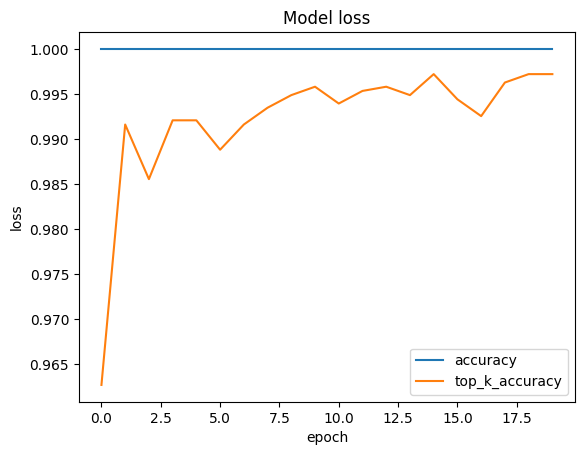

In [ ]:
plt.plot(history.history['top_k_accuracy'])
plt.plot(history.history['accuracy'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['accuracy', 'top_k_accuracy'])
plt.show()

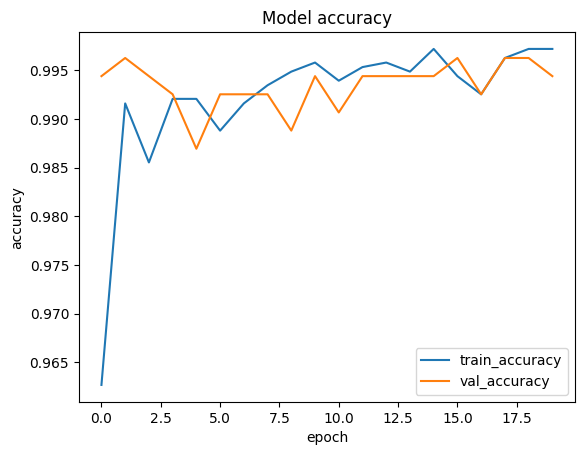

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

In [ ]:
pretrained_model.save("/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5")

## Ensembling

In [ ]:
inputs = Input(shape = (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3))

y_1 = resnet_34(inputs)
y_2 = pretrained_model(inputs)

output = 0.5*y_1 + 0.5*y_1

ensemble_model = Model(inputs = inputs, outputs = output)

# Evaluation

In [ ]:
model.load_weights('best_weights')

NotFoundError: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for best_weights

In [ ]:
hf_model.evaluate(validation_dataset)

RuntimeError: You must compile your model before training/testing. Use `model.compile(optimizer, loss)`.

# Testing

In [ ]:
test_image = cv2.imread('/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive/plasmodium-0000.jpg')
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))
im = tf.constant(test_image, dtype = tf.float32)

im = tf.expand_dims(im, axis = 0)
print(pretrained_model(im))
print(CONFIGURATION['CLASS_NAMES'][tf.argmax(pretrained_model(im), axis = -1).numpy()[0]])

tf.Tensor([[1.0000000e+00 1.8593724e-08]], shape=(1, 2), dtype=float32)
Positive


In [ ]:
print(labels.shape)

(1, 2)


InvalidArgumentError: {{function_node __wrapped__StridedSlice_device_/job:localhost/replica:0/task:0/device:GPU:0}} slice index 1 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

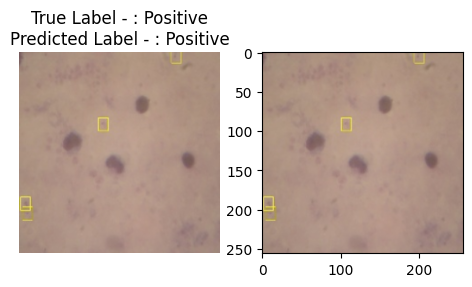

In [ ]:
plt.figure(figsize = (12,12))

for images, labels in validation_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[0]/255.)

    plt.title("True Label - : " + CONFIGURATION["CLASS_NAMES"][tf.argmax(labels[i], axis = -1).numpy()]
              + "\n" + "Predicted Label - : "
              + CONFIGURATION["CLASS_NAMES"][int(tf.argmax(pretrained_model(tf.expand_dims(images[i], axis = 0)), axis =-1).numpy()[0])] )
    plt.axis("off")

## Confusion Matrix

In [ ]:
predicted = []
labels = []

for im, label in validation_dataset:
  predicted.append(pretrained_model(im))
  labels.append(label.numpy())

In [ ]:
print(np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(labels[-1], axis = -1).flatten()]))
print(np.concatenate([np.argmax(predicted[:-1], axis = -1).flatten(), np.argmax(predicted[-1], axis = -1).flatten()]))

[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 1 0 1 0 0 0
 1 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 

In [ ]:
pred = np.concatenate([np.argmax(predicted[:-1], axis = -1).flatten(), np.argmax(predicted[-1], axis = -1).flatten()])
lab = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(labels[-1], axis = -1).flatten()])

[[472   7]
 [ 11  46]]


Text(0.5, 58.7222222222222, 'Predicted')

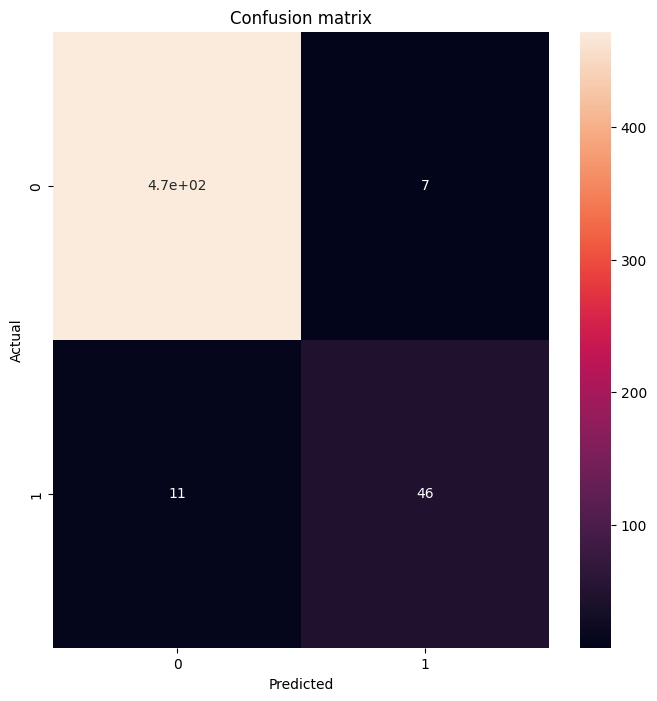

In [ ]:
cm = confusion_matrix(lab, pred)
print(cm)
plt.figure(figsize=(8,8))

sns.heatmap(cm, annot=True,)
plt.title('Confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

# Efficient-Net GRAD-CAM

## Feature Map Visualization

In [ ]:
vgg_backbone = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    weights= None,
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),

)

In [ ]:
vgg_backbone.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
def is_conv(layer_name):
  if 'conv' in layer_name:
    return True
  else:
    return False

In [ ]:
feature_maps = [layer.output for layer in vgg_backbone.layers[1:] if is_conv(layer.name)]
feature_map_model = Model(
    inputs = vgg_backbone.input,
    outputs = feature_maps
)

feature_map_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

In [ ]:
test_image = cv2.imread('/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive/plasmodium-0000.jpg')
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"]))

im = tf.constant(test_image, dtype = tf.float32)
im = tf.expand_dims(im, axis = 0)

f_maps = feature_map_model.predict(im)

1/1 [==============================] - 2s 2s/step


In [ ]:
print(len(f_maps))

13


In [ ]:
for i in range(len(f_maps)):
  print(f_maps[i].shape)

(1, 256, 256, 64)
(1, 256, 256, 64)
(1, 128, 128, 128)
(1, 128, 128, 128)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 64, 64, 256)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 32, 32, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)
(1, 16, 16, 512)


In [ ]:
for i in range(len(f_maps)):
  plt.figure(figsize = (256,256))
  f_size = f_maps[i].shape[1]
  n_channels = f_maps[i].shape[3]
  joint_maps = np.ones((f_size, f_size*n_channels ))

  axs = plt.subplot(len(f_maps), 1, i+1)

  for j in range(n_channels):
    joint_maps[:, f_size*j:f_size*(j+1)] = f_maps[i][..., j]

  plt.imshow(joint_maps[:,0:512])
  plt.axis("off")


## GradCam

In [ ]:
backbone = tf.keras.applications.efficientnet.EfficientNetB5(
    include_top = False,
    weights='imagenet',
    input_shape=(CONFIGURATION["IM_SIZE"], CONFIGURATION["IM_SIZE"], 3),
    )
backbone.trainable=False

In [ ]:
x = backbone.output

x = GlobalAveragePooling2D()(x)
x = Dense( CONFIGURATION["N_DENSE_1"], activation = "relu")(x)
x = Dense( CONFIGURATION["N_DENSE_2"], activation = "relu")(x)
output = Dense( CONFIGURATION["NUM_CLASSES"], activation = "softmax")(x)

pretrained_model = Model(backbone.inputs, output)
pretrained_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 rescaling_6 (Rescaling)     (None, 256, 256, 3)          0         ['input_5[0][0]']             
                                                                                                  
 normalization_2 (Normaliza  (None, 256, 256, 3)          7         ['rescaling_6[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_7 (Rescaling)     (None, 256, 256, 3)          0         ['normalization_2[0][0]'

In [ ]:
# pretrained_model.load_weights('/content/drive/MyDrive/Bang/mobilenet_human_emotions.h5')
pretrained_model.load_weights("/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5")

In [ ]:
img_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Positive/plasmodium-0000.jpg'

In [ ]:
test_image = cv2.imread(img_path)
test_image = cv2.resize(test_image, (CONFIGURATION["IM_SIZE"] ,CONFIGURATION["IM_SIZE"]))
im = tf.constant(test_image, dtype = tf.float32)
img_array = tf.expand_dims(im, axis = 0)
print(img_array.shape)

(1, 256, 256, 3)


In [ ]:
preds = pretrained_model.predict(img_array)

1/1 [==============================] - 4s 4s/step


In [ ]:
print(preds)

[[0.48196465 0.51803535]]


In [ ]:
np.argmax(preds[0])

1

In [ ]:
last_conv_layer_name = "top_activation"
last_conv_layer = pretrained_model.get_layer(last_conv_layer_name)
last_conv_layer_model = Model(pretrained_model.inputs, last_conv_layer.output)

In [ ]:
pretrained_model.summary()

In [ ]:
classifier_layer_names = [
 'dense_9',
#  'dense_8',
#   'dense_7'
#  ''
]

In [ ]:
classifier_input = Input(shape=(8,8,2048))
x = classifier_input
for layer_name in classifier_layer_names:
 x = pretrained_model.get_layer(layer_name)(x)
classifier_model = Model(classifier_input, x)


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

resnet_model_path = "/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5"
resnet_model = load_model(resnet_model_path)

dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative'
files = os.listdir(dir_path)

# Limit to the first five files
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    last_conv_layer = resnet_model.get_layer("top_activation")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory
    plt.show()  # Display the visualization


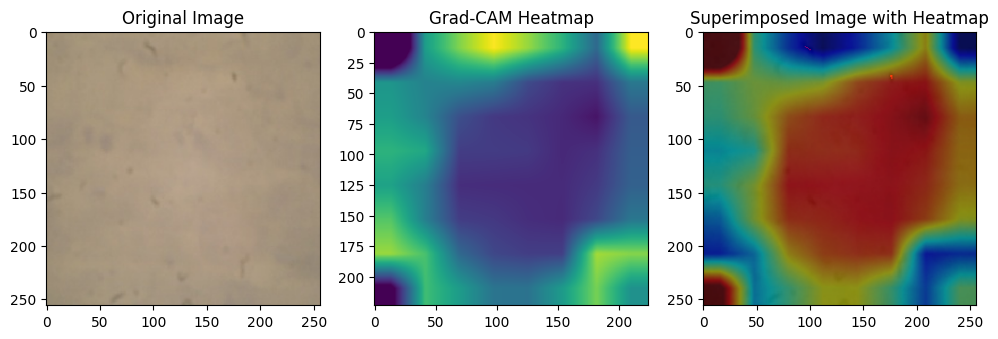

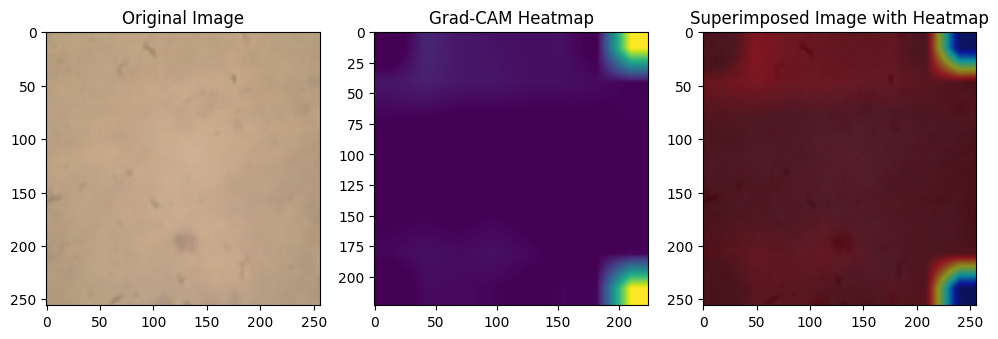

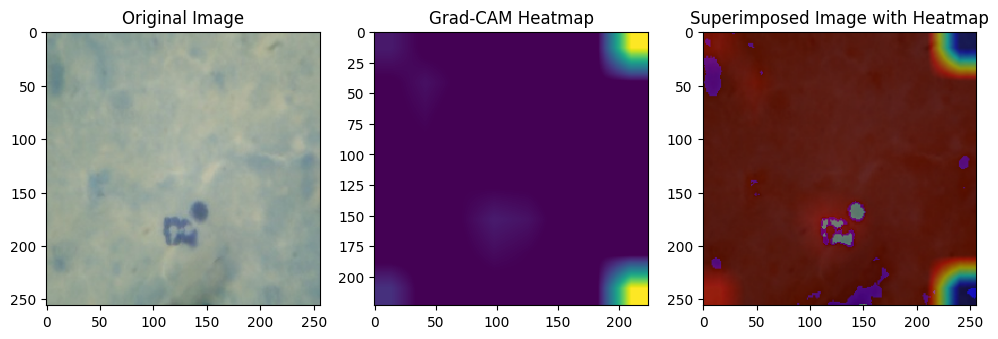

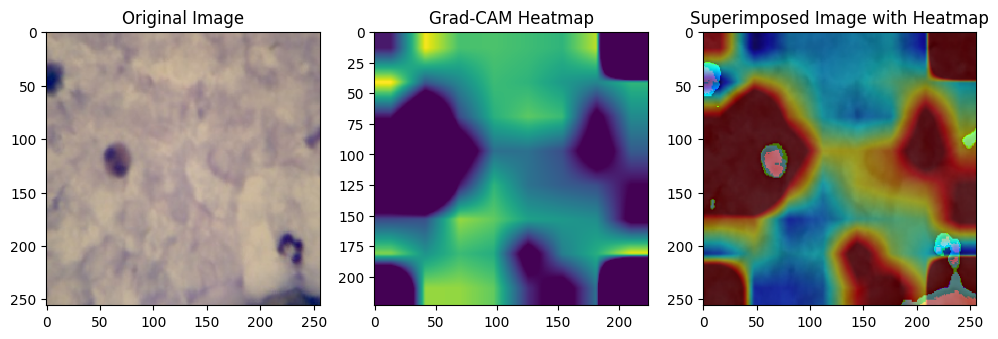

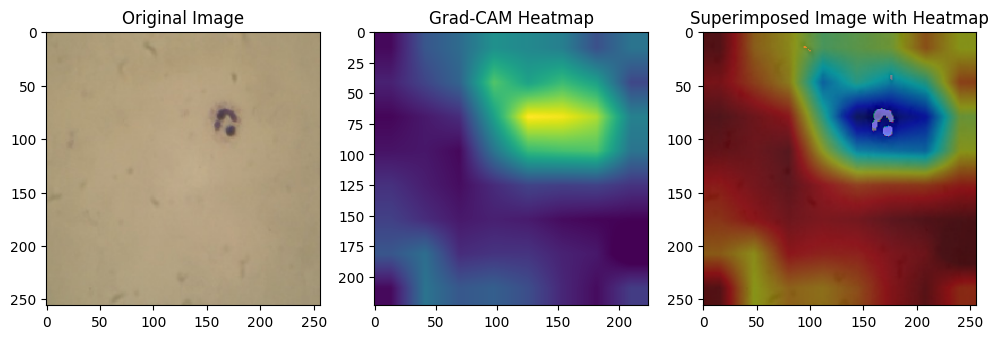

In [23]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the pre-trained model
resnet_model_path = "/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5"
resnet_model = load_model(resnet_model_path)

# Path to the dataset directory
dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative'
files = os.listdir(dir_path)

# Limit to the first 5 images
files = files[:5]

for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    # Define the Grad-CAM model
    last_conv_layer = resnet_model.get_layer("top_activation")
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(x)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)[0]
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)

    # Display the visualizations
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('Grad-CAM Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with Heatmap')

    # Save each visualization with a unique name (commented out for display purposes)
    # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
    # plt.savefig(save_path)
    # plt.close()  # Close the current figure to free up memory

    plt.show()  # Display the visualization


In [30]:
# import os
# import cv2
# import numpy as np
# import tensorflow as tf
# from tensorflow.keras.preprocessing import image
# from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
# import matplotlib.pyplot as plt
# from tensorflow.keras.models import load_model

# resnet_model_path = "/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5"
# resnet_model = load_model(resnet_model_path)


# dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative'
# files = os.listdir(dir_path)

# for file in files:
#     # Full path to the image file
#     img_path = os.path.join(dir_path, file)

#     # Load and preprocess the image
#     img = image.load_img(img_path, target_size=(256, 256))
#     x = image.img_to_array(img)
#     x = np.expand_dims(x, axis=0)
#     x = preprocess_input(x)
#     last_conv_layer = resnet_model.get_layer("top_activation")
#     grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

#     with tf.GradientTape() as tape:
#         conv_outputs, predictions = grad_model(x)
#         loss = predictions[:, np.argmax(predictions[0])]
#     grads = tape.gradient(loss, conv_outputs)[0]
#     weights = tf.reduce_mean(grads, axis=(0, 1))
#     cam = np.dot(conv_outputs[0], weights.numpy())
#     cam = cv2.resize(cam, (224, 224))
#     cam = np.maximum(cam, 0)
#     cam = cam / cam.max()
#     heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

#     original_img_uint8 = np.uint8(x[0])
#     heatmap_uint8 = np.uint8(heatmap)
#     heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
#     superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
#     plt.figure(figsize=(12, 6))

#     plt.subplot(1, 3, 1)
#     plt.imshow(img)
#     plt.title('Original Image')

#     plt.subplot(1, 3, 2)
#     plt.imshow(cam, cmap='viridis')
#     plt.title('Grad-CAM Heatmap')

#     plt.subplot(1, 3, 3)
#     plt.imshow(superimposed_img)
#     plt.title('Superimposed Image with Heatmap')

#     # Save each visualization with a unique name
#     # save_path = os.path.join('/content/drive/MyDrive/grad_cam_visualizations', f'grad_cam_{file}')
#     # plt.savefig(save_path)
#     # plt.close()  # Close the current figure to free up memory
#     plt.show()  # Display the visualization


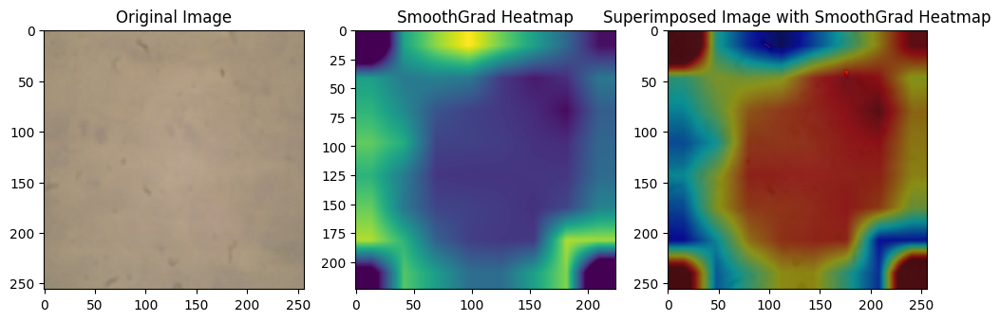

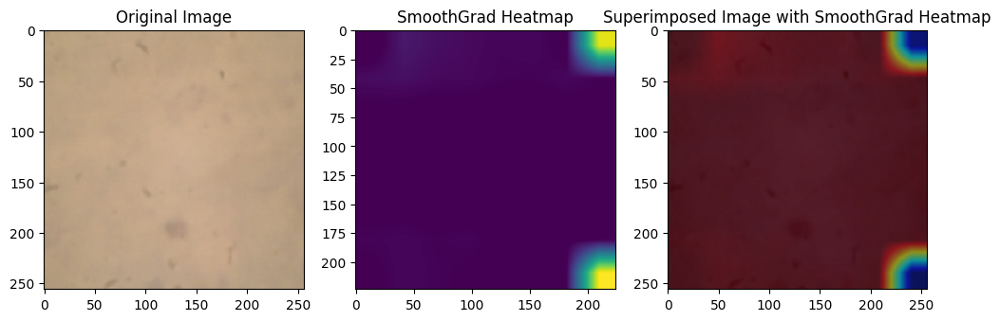

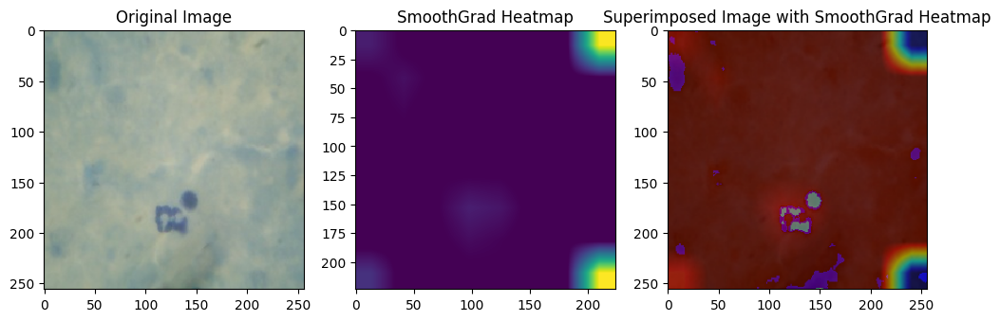

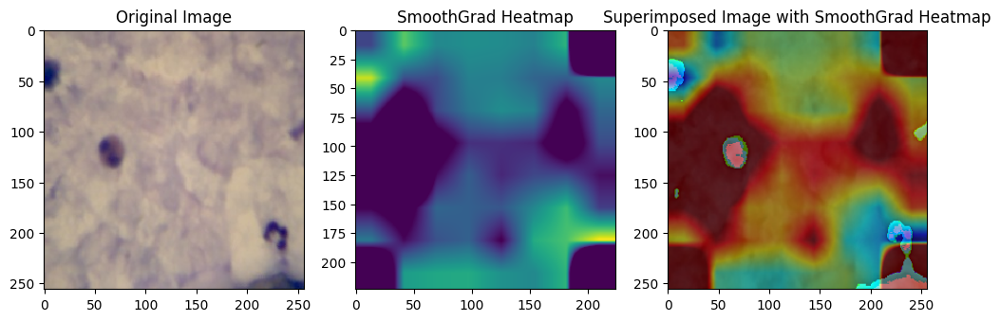

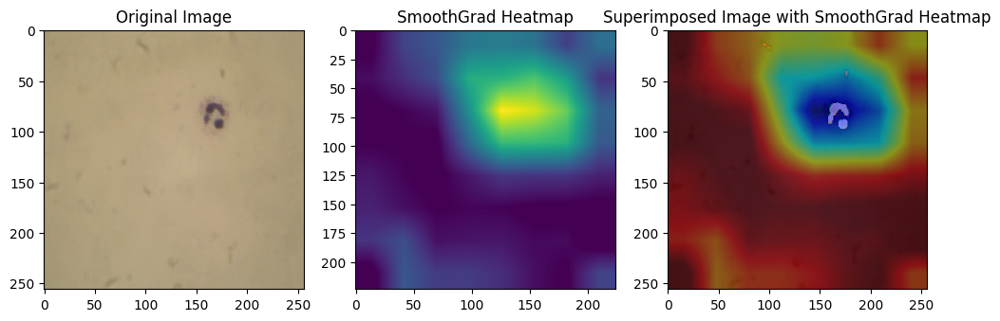

In [3]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

resnet_model_path = "/content/drive/MyDrive/DATASETS/Resized_Annotated_Folder/effnet_keras.h5"
resnet_model = load_model(resnet_model_path)


dir_path = '/content/drive/MyDrive/DATASETS/Annotated_Folder/train/Negative'
files = os.listdir(dir_path)

# Define the number of noise samples for SmoothGrad
num_samples = 10
last_conv_layer = resnet_model.get_layer("top_activation")
files = files[:5]
for file in files:
    # Full path to the image file
    img_path = os.path.join(dir_path, file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(256, 256))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    grad_model = tf.keras.models.Model([resnet_model.inputs], [last_conv_layer.output, resnet_model.output])

    # Create a function to generate noisy images
    def generate_noisy_images(input_image, stddev=0.2):
        noise = np.random.normal(0, stddev, input_image.shape)
        noisy_images = input_image + noise
        return noisy_images

        # Generate noisy images for SmoothGrad
    noisy_inputs = generate_noisy_images(x, stddev=0.2)
    noisy_inputs = np.expand_dims(noisy_inputs, axis=0)  # Add batch dimension
    noisy_inputs = np.repeat(noisy_inputs, num_samples, axis=0)  # Repeat for SmoothGrad
    noisy_inputs = noisy_inputs[:, 0, :, :, :]
    # Perform SmoothGrad calculation
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(noisy_inputs)
        loss = predictions[:, np.argmax(predictions[0])]
    grads = tape.gradient(loss, conv_outputs)

    # Average gradients over the noisy samples
    avg_grads = tf.reduce_mean(grads, axis=0)
    weights = tf.reduce_mean(avg_grads, axis=(0, 1))

    # Reshape weights to match the last conv layer output shape
    weights_reshaped = np.expand_dims(weights, axis=(0, 1, 2))  # Adjust dimensions as needed


    cam = np.dot(conv_outputs[0], weights.numpy())
    cam = cv2.resize(cam, (224, 224))
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)

    original_img_uint8 = np.uint8(x[0])
    heatmap_uint8 = np.uint8(heatmap)
    heatmap_uint8 = cv2.resize(heatmap_uint8, (original_img_uint8.shape[1], original_img_uint8.shape[0]))
    superimposed_img = cv2.addWeighted(original_img_uint8, 0.5, heatmap_uint8, 0.5, 0)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap='viridis')
    plt.title('SmoothGrad Heatmap')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title('Superimposed Image with SmoothGrad Heatmap')

    plt.show()  # Display the visualization


In [ ]:
with tf.GradientTape() as tape:
  last_conv_layer_output = last_conv_layer_model(img_array)
  preds = classifier_model(last_conv_layer_output)
  top_pred_index = tf.argmax(preds[0])
  print(top_pred_index)
  top_class_channel = preds[:, top_pred_index]

grads = tape.gradient(top_class_channel, last_conv_layer_output)

ValueError: Exception encountered when calling layer 'model_13' (type Functional).

Input 0 of layer "dense_9" is incompatible with the layer: expected axis -1 of input shape to have value 128, but received input with shape (1, 8, 8, 2048)

Call arguments received by layer 'model_13' (type Functional):
  • inputs=tf.Tensor(shape=(1, 8, 8, 2048), dtype=float32)
  • training=None
  • mask=None

In [3]:
grads.shape

In [ ]:
pooled_grads = tf.reduce_mean(grads, axis=(0,1,2)).numpy()

In [ ]:
print(pooled_grads.shape)

(2048,)


In [ ]:
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(2048):
  last_conv_layer_output[:, :, i] *= pooled_grads[i]

In [ ]:
print(last_conv_layer_output.shape)

(8, 8, 2048)


In [ ]:
heatmap = np.sum(last_conv_layer_output, axis=-1)

In [2]:
heatmap=tf.nn.relu(heatmap)
plt.matshow(heatmap)

In [1]:
# resized_heatmap=cv2.resize(np.array(heatmap),(256,256))
plt.matshow(resized_heatmap*255+img_array[0,:,:,0]/255)